<h1 align="center"><font color="orange" face="cursive" size=7> 2022 SAS HACKATHON </font></h1>

<h1 align="center"><font color="grey" face="Sans" size=7> Preliminary Data Processing - EDA + Data Preprocessing </font></h1>

---

> **Author** &#127942; `::` Jin Kun Chai `::` John Basora `::` John Moss `::` Sabuj Saha `::` Srujana Daggubati `::` Tiffany Bui `::` Tonmoy Paul `::` Tuan Le <br>
> **Advisor** &#128640; Suman Misra <br>
> **College** &#128187; Oklahoma State University <br>
> **Submission** &#128197; April 8

---

<font color="gray" face="sans-serif" size=6> Foreword </font>

This notebook act as the first data pipeline by performing EDA and data preprocessing. The two datasets collected from Morningstar Direct provided by our institutions contain the funds feature and daily prices for about 2 years. The data is limited due to the pay subscriptions which causes the team to not have the capacity to collect more data from Morningstar Direct sources to strengthen the current datasets. Thus, these 2 datasets are the only datasets that can be used for this ESG analysis.

Another 2 datasets are the complete funds name collected manually online due to the downloaded Excel sheet cannot recognize the symbols used by this fund names. Thus, funds rename is a critical step and is performed in the `Fund Dataset` section.

The goal of this notebook is to come up with as much helpful features as possible from the investors standpoint so that the final datasets can provided useful analysis for any ESG investors to make the best investments decision.

---

# Plan Of Analysis

## Datasets:
1. `funds.csv` - funds dataset, need rename, remove unused columns, unused rows and imputation
2. `prices_per_day.csv` - funds data with daily prices; not all data has prices data
3. `tickerNameNeedFill_first.csv` - fund that have first 180 names needed for rename fund names
4. `tickerNameNeedFill_second.csv` - fund that has last 360 names needed for rename fund names

## Process:
1. Read all datasets & observed data type & type check
2. Observe `prices_per_day.csv` by grouping by fund names
    * Compute returns, cumulative returns, means, & standard deviation
    * Perform horizon data
3. Observe `funds.csv` data
    * look for missing values & make decisions
    * Perform imputation if possible
    * Remove data
    * Compare price & fund datasets
    * Identify non-character fund name data
    * clean fund name
    * categorizing data & adding features
4. Summarize & output data
    * `fundsDummy.csv`
    * `horizonDummy.csv`
    * `prices.csv`
    * `log_return.csv`
    * `daily_return.csv`
    * `cumulative_return.csv`

In [1]:
## This can be used to reference the files from SAS CAS in the SAS ENVIRONMENT
## But for our purpose, this is not used
# import swat

# # Get Information for the Connection
# file = open("./shared_data/Authorization_Code_URL.txt")
# # read the file as a list
# data = file.readlines()
# # close the file
# file.close()

# baseURL = data[0].split('/')[2]
# # print(baseURL)

# file = open("./shared_data/access_token.txt")
# # read the file as a list
# data = file.readlines()
# # close the file
# file.close()

# code = data[0]
# # print(code)

# # Establish a CAS session
# conn = swat.CAS(f"https://{baseURL}/cas-shared-default-http", username=None, password=code)

# # Verify connection details
# conn

In [2]:
## import modules for analysis
import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
## read file; need wider scope other than UTF-8 for symbols
funds_data = pd.read_csv('./data/funds.csv')
price_data = pd.read_csv('./data/prices_per_day.csv')
fill1_data = pd.read_csv('./data/tickerNameNeedFill_first.csv', encoding='ISO-8859-1')
fill2_data = pd.read_csv('./data/tickerNameNeedFill_second.csv', encoding='ISO-8859-1') 

---

# Price Data

Observe price dataset by performing EDA and performing feature understanding then move into data preprocessing to add features to the final dataset for further predictive analysis. The steps for all analysis presented below are similar, observe prices trend over time, correlation of all funds, and first few 100 funds' correlations; this include the daily return and monthly return computation. Notice that most funds are highly correlated based on price and returns, which is something that the team is aware of and working vigilantly on the analysis.

The goal of this section is to come out with final datasets that can add values for the further SAS machine learning analysis.

In [4]:
## collect price information
price_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2996123 entries, 0 to 2996122
Data columns (total 3 columns):
 #   Column       Dtype  
---  ------       -----  
 0   date_time    object 
 1   stock_price  float64
 2   stock_name   object 
dtypes: float64(1), object(2)
memory usage: 68.6+ MB


In [5]:
## observe price data
price_data.head()

,date_time,stock_price,stock_name
0,2019-12-24 14:30:00,20.52,SSIAX
1,2019-12-26 14:30:00,20.60,SSIAX
2,2019-12-27 14:30:00,20.61,SSIAX
3,2019-12-30 14:30:00,20.53,SSIAX
4,2019-12-31 14:30:00,20.55,SSIAX


In [6]:
## make data into pivot table & observe structure
price_data = pd.pivot_table(price_data, values='stock_price', index='date_time', columns='stock_name')
price_data.columns.name = None
price_data.index.name = None
price_data.index = pd.to_datetime(pd.to_datetime(price_data.index).strftime('%Y-%m-%d'))
price_data.head()

,AAAAX,AAAIX,AAANX,AAAPX,AAAQX,AAARX,AAASX,AAAUX,AAAVX,AAAWX,...,WWHCX,WWIDX,YACKX,YAFFX,YAFIX,YCGEX,ZDIIX,ZDIVX,ZGEIX,ZSRIX
2019-12-24,10.54,7.24,12.87,10.48,10.61,7.38,10.45,7.21,10.45,10.54,...,NaN,13.79,20.40,18.16,18.10,21.35,22.09,22.11,NaN,10.06
2019-12-26,10.58,7.26,12.94,10.52,10.65,7.40,10.49,7.24,10.49,10.58,...,NaN,13.83,20.47,18.23,18.17,21.44,22.14,22.15,NaN,NaN
2019-12-27,10.61,7.27,12.94,10.55,10.68,7.41,10.52,7.24,10.52,10.61,...,NaN,13.82,20.50,18.26,18.20,21.48,22.12,22.13,NaN,10.06
2019-12-30,10.58,7.24,12.85,10.52,10.66,7.37,10.49,7.21,10.50,10.58,...,NaN,13.76,20.41,18.18,18.12,21.34,22.02,22.04,NaN,10.04
2019-12-31,10.62,7.25,12.89,10.56,10.70,NaN,10.53,7.22,10.54,10.62,...,NaN,13.79,20.48,18.25,18.19,21.37,22.09,22.10,NaN,10.04


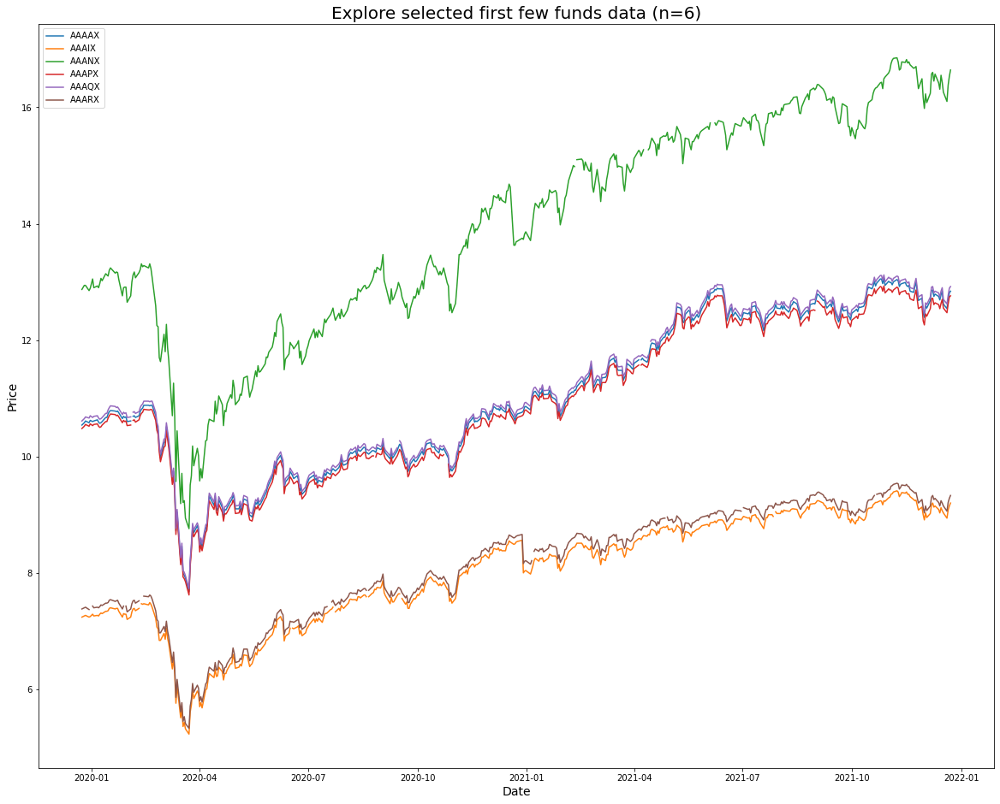

In [7]:
## plot time series data
nfund = 6

_ = plt.figure(figsize=(20, 16))
_ = plt.plot(price_data.index, price_data.iloc[:,:nfund])
_ = plt.title(f'Explore selected first few funds data (n={nfund})', size=20)
_ = plt.xlabel('Date', size=14)
_ = plt.ylabel('Price', size=14)
_ = plt.legend(price_data.columns[:nfund])
_ = plt.show()

In [8]:
## quick observed on correlation
price_data.corr()

,AAAAX,AAAIX,AAANX,AAAPX,AAAQX,AAARX,AAASX,AAAUX,AAAVX,AAAWX,...,WWHCX,WWIDX,YACKX,YAFFX,YAFIX,YCGEX,ZDIIX,ZDIVX,ZGEIX,ZSRIX
AAAAX,1.000000,0.948475,0.973254,0.999924,0.999987,0.951096,0.999993,0.948678,0.999983,0.999993,...,0.942329,0.946879,0.979471,0.965715,0.965500,0.976686,0.987671,0.987658,0.706541,0.703393
AAAIX,0.948475,1.000000,0.990084,0.947748,0.948146,0.999837,0.949190,0.999984,0.948252,0.949285,...,0.977647,0.924095,0.977033,0.977484,0.977584,0.966512,0.923317,0.923230,0.908478,0.622538
AAANX,0.973254,0.990084,1.000000,0.972796,0.973022,0.991325,0.973471,0.990012,0.973214,0.973674,...,0.972891,0.939443,0.989461,0.985434,0.985339,0.977193,0.958839,0.958741,0.858196,0.657419
AAAPX,0.999924,0.947748,0.972796,1.000000,0.999962,0.950521,0.999892,0.947972,0.999852,0.999924,...,0.943876,0.946791,0.978794,0.965125,0.964859,0.975401,0.988249,0.988241,0.713318,0.706024
AAAQX,0.999987,0.948146,0.973022,0.999962,1.000000,0.950831,0.999974,0.948363,0.999955,0.999987,...,0.942680,0.946812,0.979187,0.965472,0.965201,0.976196,0.987938,0.987927,0.707514,0.704735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YCGEX,0.976686,0.966512,0.977193,0.975401,0.976196,0.966643,0.977046,0.966361,0.977271,0.976932,...,0.930547,0.937176,0.971703,0.956507,0.956921,1.000000,0.951120,0.951084,0.675939,0.613961
ZDIIX,0.987671,0.923317,0.958839,0.988249,0.987938,0.928204,0.987552,0.924951,0.987125,0.987525,...,0.936822,0.940715,0.970873,0.958477,0.957864,0.951120,1.000000,0.999998,0.672244,0.736795
ZDIVX,0.987658,0.923230,0.958741,0.988241,0.987927,0.928140,0.987535,0.924869,0.987112,0.987514,...,0.936820,0.940522,0.970401,0.957673,0.957043,0.951084,0.999998,1.000000,0.668840,0.736198
ZGEIX,0.706541,0.908478,0.858196,0.713318,0.707514,0.907792,0.705849,0.908594,0.714775,0.707412,...,0.492321,0.206143,0.607639,0.603634,0.596895,0.675939,0.672244,0.668840,1.000000,0.026426


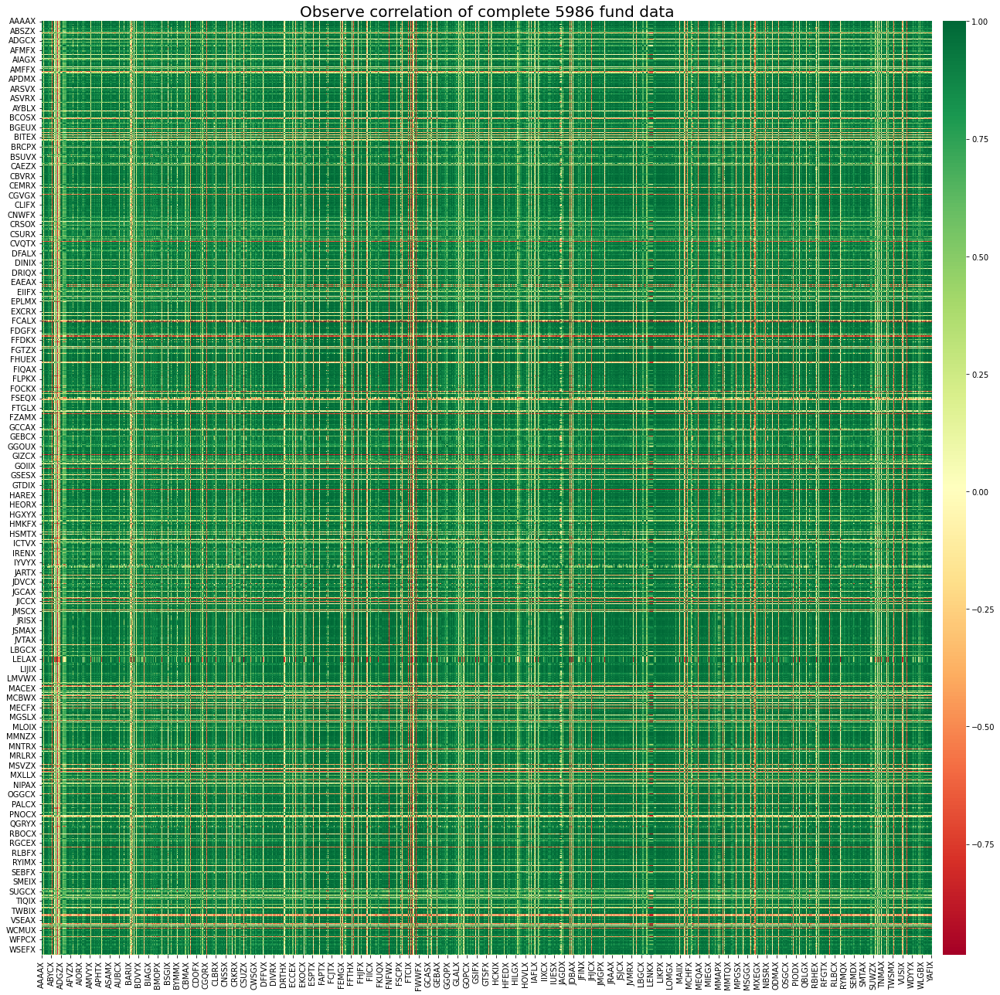

In [9]:
## plot all data for correlation
_ = plt.figure(figsize=(20,18))
_ = sns.heatmap(price_data.corr(), 
                cmap='RdYlGn', cbar=True, cbar_kws={"shrink": 1.0, "aspect": 40, "pad":0.01})
_ = plt.title(f'Observe correlation of complete {len(price_data.columns)} fund data', size=20)
_ = plt.tight_layout()
_ = plt.show()

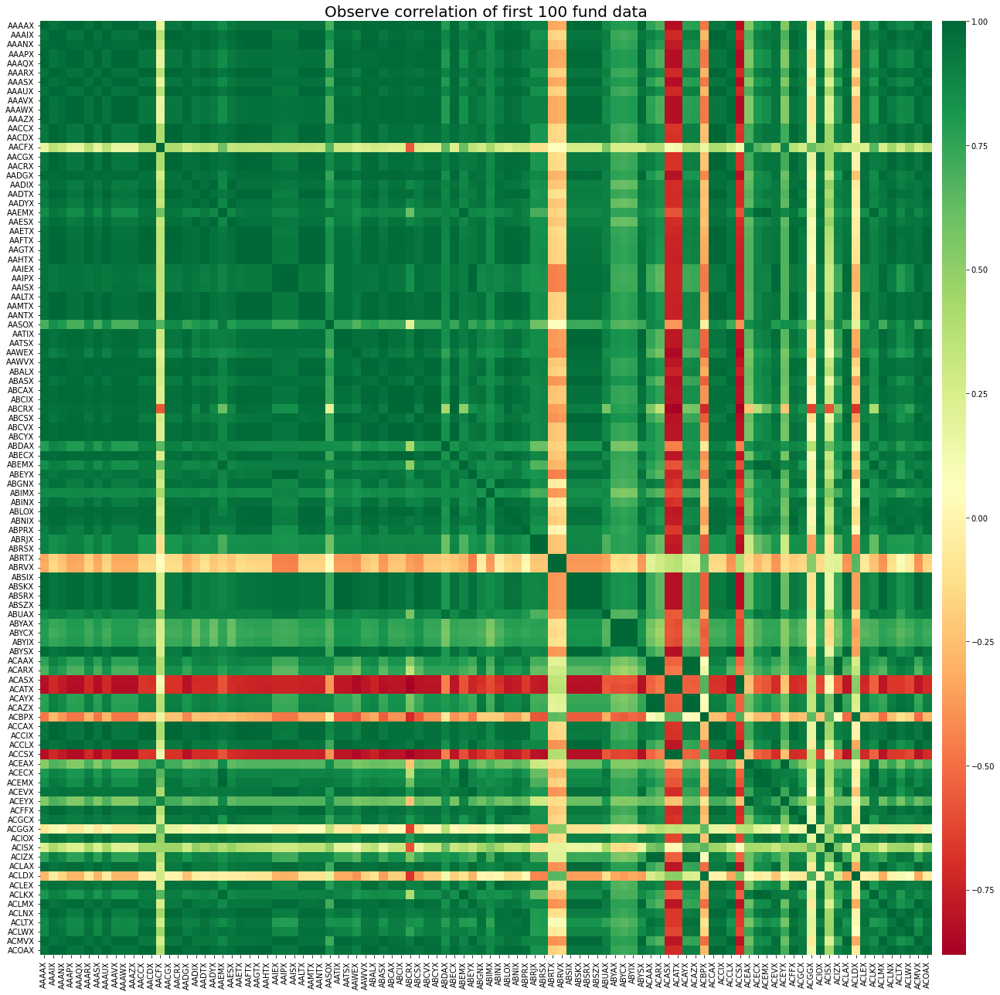

In [10]:
## plot heatmap to observe correlation of selected funds data
nfund=100

_ = plt.figure(figsize=(20,18))
_ = sns.heatmap(price_data.iloc[:,:nfund].corr(), xticklabels=price_data.columns[:nfund], 
                yticklabels=price_data.columns[:nfund],  
                cmap='RdYlGn', cbar=True, cbar_kws={"shrink": 1.0, "aspect": 40, "pad":0.01})
_ = plt.title(f'Observe correlation of first {nfund} fund data', size=20)
_ = plt.tight_layout()
_ = plt.show()

In [11]:
## check price information
price_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 505 entries, 2019-12-24 to 2021-12-23
Columns: 5986 entries, AAAAX to ZSRIX
dtypes: float64(5986)
memory usage: 23.1 MB


## Daily return

This section computes daily return, cumulative return, and log-return using daily price data. Daily return is the simple return, also known as volatility, and it is the most widely used method. This method is simple and straightforward and easy to understand.

$return_{daily}=\dfrac{price_{t}-price_{t-1}}{price_{t-1}}$

$where\\$
$\hspace{1cm}price_{t}: current\hspace{0.1cm}price\hspace{0.1cm}as\hspace{0.1cm}t\hspace{0.1cm}period\\$
$\hspace{1cm}price_{t-1}: previous\hspace{0.1cm}price\hspace{0.1cm}from\hspace{0.1cm}t\hspace{0.1cm}period\\$

Cumulative return is easy to look at relatively to daily return, presented below, because it takes account of the return from all previous period since the initial date of investment by compounding it, so that anyone can clearly observe the gain or loss of a particular fund invested from a specific period, in this case, 2019 December 24 is the initial date of investment.

$return_{cumulative}=\prod_{t=1}^{T} (1 + return_{daily_{t}}) - 1$

$where\\$
$\hspace{1cm}t: current\hspace{0.1cm}period\\$
$\hspace{1cm}T: last\hspace{0.1cm}period\\$

Log return, although, is not easy to understand but tends to be mathematically better because of normally distributed characteristics making it more representative than the arithmetic simple return calculation. 

$return_{log-daily}=log({price_{t}}) - log({price_{t-1}})$

$where\\$
$\hspace{1cm}price_{t}: current\hspace{0.1cm}price\hspace{0.1cm}as\hspace{0.1cm}t\hspace{0.1cm}period\\$
$\hspace{1cm}price_{t-1}: previous\hspace{0.1cm}price\hspace{0.1cm}from\hspace{0.1cm}t\hspace{0.1cm}period\\$



In [12]:
## compute daily return
daily_return = price_data.pct_change(1)
daily_return.head()

,AAAAX,AAAIX,AAANX,AAAPX,AAAQX,AAARX,AAASX,AAAUX,AAAVX,AAAWX,...,WWHCX,WWIDX,YACKX,YAFFX,YAFIX,YCGEX,ZDIIX,ZDIVX,ZGEIX,ZSRIX
2019-12-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-12-26,0.003795,0.002762,0.005439,0.003817,0.003770,0.002710,0.003828,0.004161,0.003828,0.003795,...,NaN,0.002901,0.003431,0.003855,0.003867,0.004215,0.002263,0.001809,NaN,0.000000
2019-12-27,0.002836,0.001377,0.000000,0.002852,0.002817,0.001351,0.002860,0.000000,0.002860,0.002836,...,NaN,-0.000723,0.001466,0.001646,0.001651,0.001866,-0.000903,-0.000903,NaN,0.000000
2019-12-30,-0.002828,-0.004127,-0.006955,-0.002844,-0.001873,-0.005398,-0.002852,-0.004144,-0.001901,-0.002828,...,NaN,-0.004342,-0.004390,-0.004381,-0.004396,-0.006518,-0.004521,-0.004067,NaN,-0.001988
2019-12-31,0.003781,0.001381,0.003113,0.003802,0.003752,0.000000,0.003813,0.001387,0.003810,0.003781,...,NaN,0.002180,0.003430,0.003850,0.003863,0.001406,0.003179,0.002722,NaN,0.000000


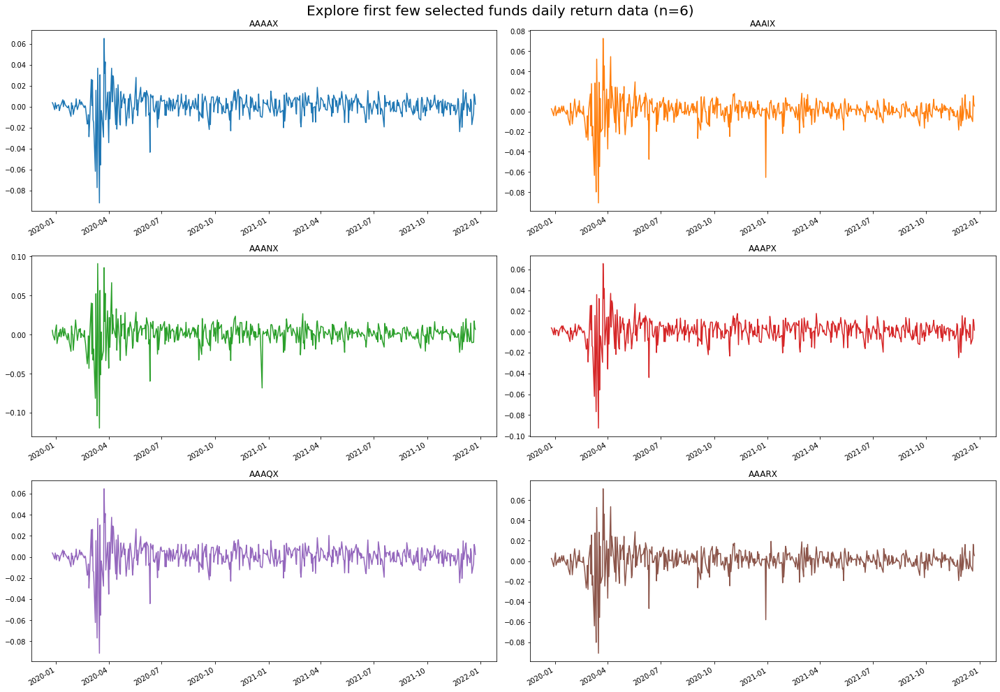

In [13]:
## plot sample of daily return
## initialize number of rows & columns
nrows = 3
ncols = 2

## extract columns fund data name
cols = daily_return.columns[:nrows*ncols]

## compute colors
colors = plt.rcParams["axes.prop_cycle"]()

## assigne each axis position
idx = [(r, c) for r in range(nrows) for c in range(ncols)]

## plot subplots for selected data
fig, ax = plt.subplots(nrows, ncols,figsize=(20,14))
for i in range(len(cols)):
    c = next(colors)["color"]
    daily_return[cols[i]].plot(ax=ax[idx[i]], color=c)
    ax[idx[i]].set_title(cols[i])
_ = plt.suptitle(f'Explore first few selected funds daily return data (n={len(cols)})', size=20)
_ = plt.tight_layout()
_ = plt.show()


In [14]:
## compute cumulative return
daily_cumreturn = (daily_return + 1).cumprod() - 1
daily_cumreturn.head()

,AAAAX,AAAIX,AAANX,AAAPX,AAAQX,AAARX,AAASX,AAAUX,AAAVX,AAAWX,...,WWHCX,WWIDX,YACKX,YAFFX,YAFIX,YCGEX,ZDIIX,ZDIVX,ZGEIX,ZSRIX
2019-12-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-12-26,0.003795,2.762431e-03,0.005439,0.003817,0.003770,0.002710,0.003828,0.004161,0.003828,0.003795,...,NaN,0.002901,0.003431,0.003855,0.003867,0.004215,0.002263,0.001809,NaN,0.000000
2019-12-27,0.006641,4.143646e-03,0.005439,0.006679,0.006598,0.004065,0.006699,0.004161,0.006699,0.006641,...,NaN,0.002175,0.004902,0.005507,0.005525,0.006089,0.001358,0.000905,NaN,0.000000
2019-12-30,0.003795,-1.110223e-16,-0.001554,0.003817,0.004713,-0.001355,0.003828,0.000000,0.004785,0.003795,...,NaN,-0.002175,0.000490,0.001101,0.001105,-0.000468,-0.003169,-0.003166,NaN,-0.001988
2019-12-31,0.007590,1.381215e-03,0.001554,0.007634,0.008483,-0.001355,0.007656,0.001387,0.008612,0.007590,...,NaN,0.000000,0.003922,0.004956,0.004972,0.000937,0.000000,-0.000452,NaN,-0.001988


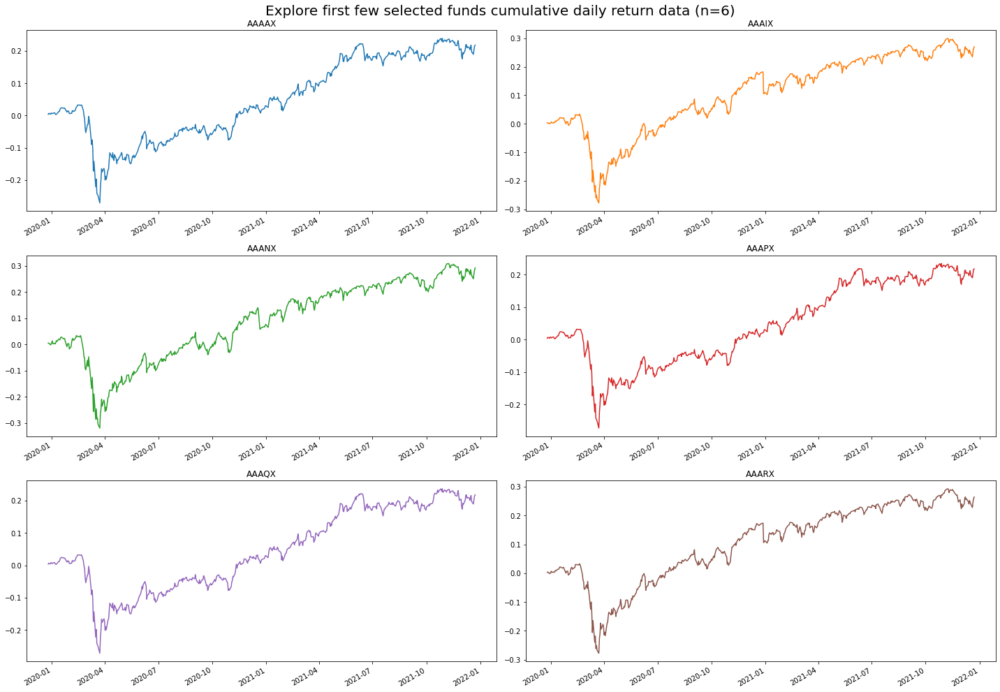

In [15]:
## plot sample of daily return
## initialize number of rows & columns
nrows = 3
ncols = 2

## extract columns fund data name
cols = daily_cumreturn.columns[:nrows*ncols]

## compute colors
colors = plt.rcParams["axes.prop_cycle"]()

## assigne each axis position
idx = [(r, c) for r in range(nrows) for c in range(ncols)]

## plot subplots for selected data
fig, ax = plt.subplots(nrows, ncols,figsize=(20,14))
for i in range(len(cols)):
    c = next(colors)["color"]
    daily_cumreturn[cols[i]].plot(ax=ax[idx[i]], color=c)
    ax[idx[i]].set_title(cols[i])
_ = plt.suptitle(f'Explore first few selected funds cumulative daily return data (n={len(cols)})', size=20)
_ = plt.tight_layout()
_ = plt.show()


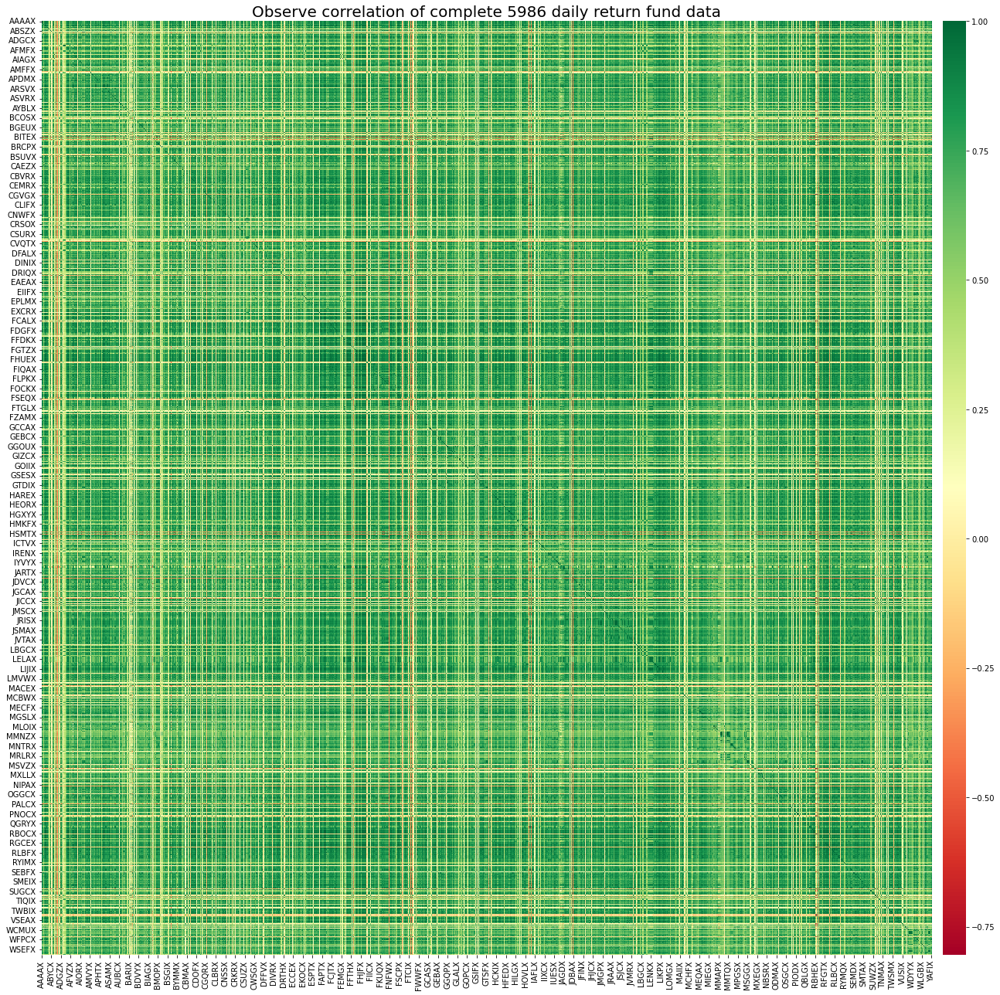

In [16]:
## plot all data for correlation
_ = plt.figure(figsize=(20,18))
_ = sns.heatmap(daily_return.corr(), 
                cmap='RdYlGn', cbar=True, cbar_kws={"shrink": 1.0, "aspect": 40, "pad":0.01})
_ = plt.title(f'Observe correlation of complete {len(daily_return.columns)} daily return fund data', size=20)
_ = plt.tight_layout()
_ = plt.show()

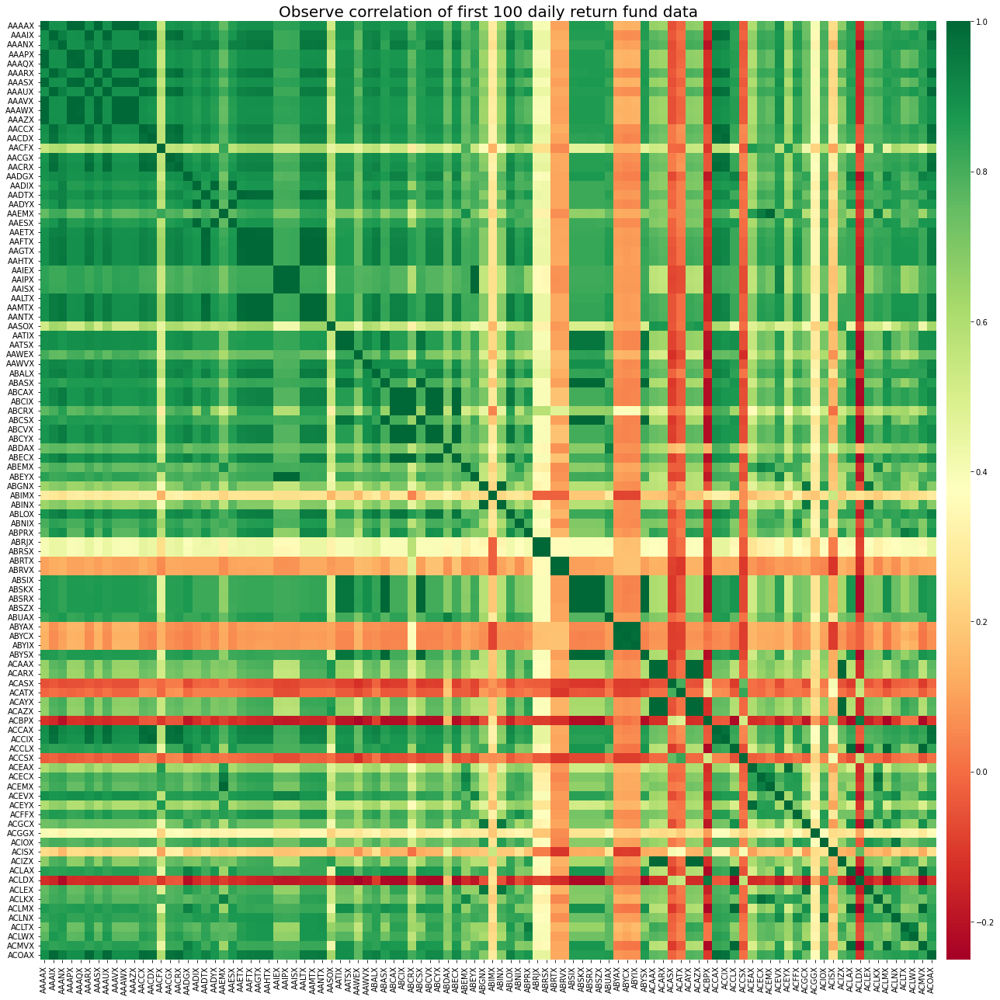

In [17]:
## plot heatmap to observe correlation of selected funds data
nfund=100

_ = plt.figure(figsize=(20,18))
_ = sns.heatmap(daily_return.iloc[:,:nfund].corr(), xticklabels=daily_return.columns[:nfund], 
                yticklabels=daily_return.columns[:nfund],  
                cmap='RdYlGn', cbar=True, cbar_kws={"shrink": 1.0, "aspect": 40, "pad":0.01})
_ = plt.title(f'Observe correlation of first {nfund} daily return fund data', size=20)
_ = plt.tight_layout()
_ = plt.show()

In [18]:
## compute log return
log_return = np.log(price_data) - np.log(price_data.shift(1))
log_return.head()

,AAAAX,AAAIX,AAANX,AAAPX,AAAQX,AAARX,AAASX,AAAUX,AAAVX,AAAWX,...,WWHCX,WWIDX,YACKX,YAFFX,YAFIX,YCGEX,ZDIIX,ZDIVX,ZGEIX,ZSRIX
2019-12-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-12-26,0.003788,0.002759,0.005424,0.003810,0.003763,0.002706,0.003820,0.004152,0.003820,0.003788,...,NaN,0.002896,0.003425,0.003847,0.003860,0.004207,0.002261,0.001808,NaN,NaN
2019-12-27,0.002832,0.001376,0.000000,0.002848,0.002813,0.001350,0.002856,0.000000,0.002856,0.002832,...,NaN,-0.000723,0.001464,0.001644,0.001650,0.001864,-0.000904,-0.000903,NaN,NaN
2019-12-30,-0.002832,-0.004135,-0.006979,-0.002848,-0.001874,-0.005413,-0.002856,-0.004152,-0.001903,-0.002832,...,NaN,-0.004351,-0.004400,-0.004391,-0.004405,-0.006539,-0.004531,-0.004075,NaN,-0.00199
2019-12-31,0.003774,0.001380,0.003108,0.003795,0.003745,NaN,0.003806,0.001386,0.003802,0.003774,...,NaN,0.002178,0.003424,0.003843,0.003856,0.001405,0.003174,0.002719,NaN,0.00000


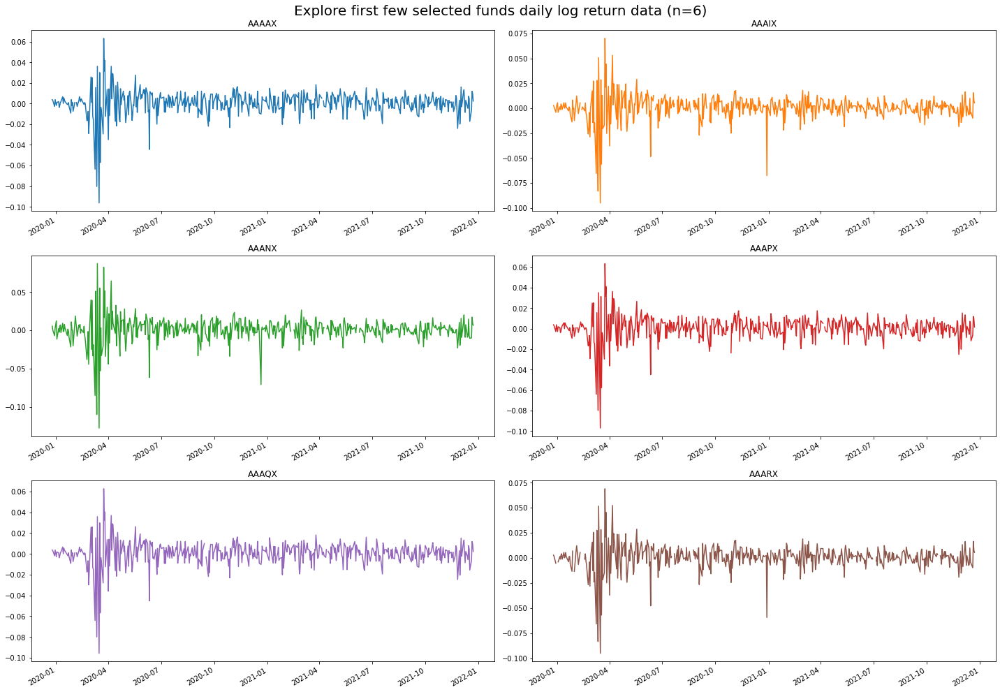

In [19]:
## plot sample of daily return
## initialize number of rows & columns
nrows = 3
ncols = 2

## extract columns fund data name
cols = log_return.columns[:nrows*ncols]

## compute colors
colors = plt.rcParams["axes.prop_cycle"]()

## assigne each axis position
idx = [(r, c) for r in range(nrows) for c in range(ncols)]

## plot subplots for selected data
fig, ax = plt.subplots(nrows, ncols,figsize=(20,14))
for i in range(len(cols)):
    c = next(colors)["color"]
    log_return[cols[i]].plot(ax=ax[idx[i]], color=c)
    ax[idx[i]].set_title(cols[i])
_ = plt.suptitle(f'Explore first few selected funds daily log return data (n={len(cols)})', size=20)
_ = plt.tight_layout()
_ = plt.show()


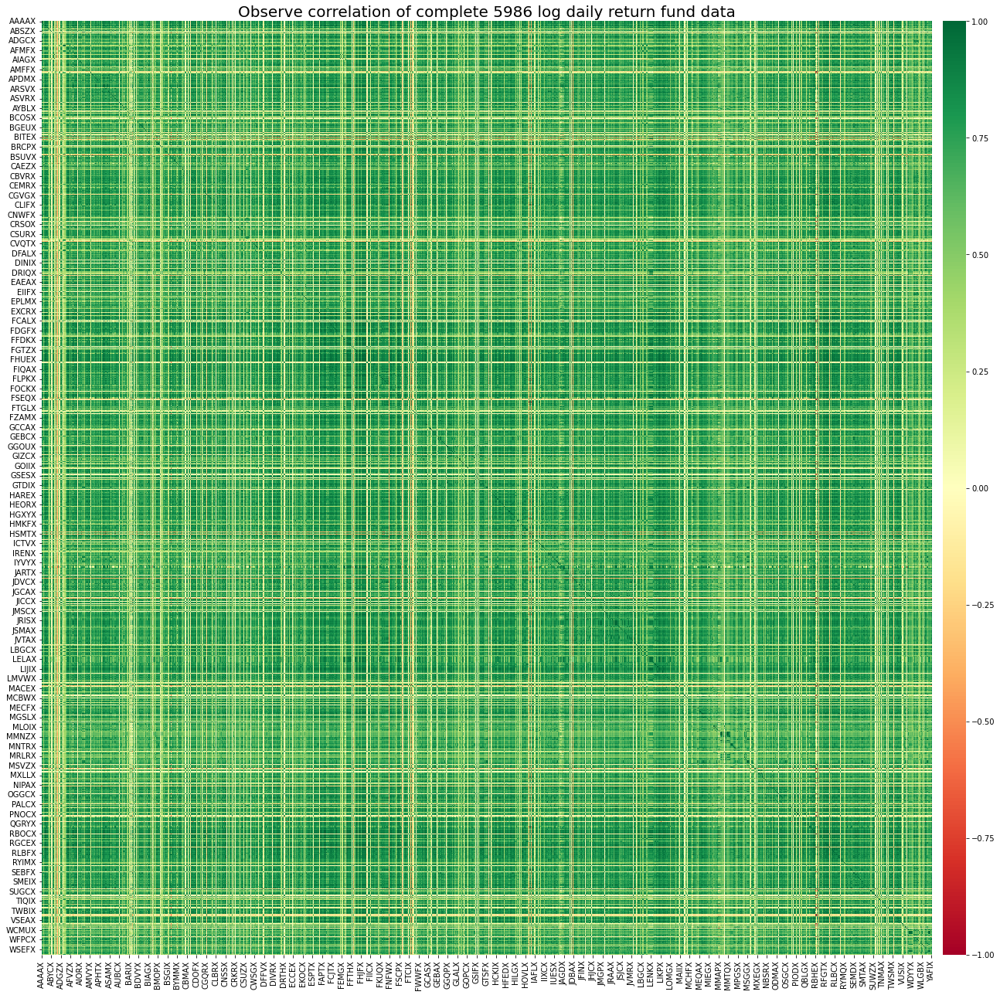

In [20]:
## plot all data for correlation
_ = plt.figure(figsize=(20,18))
_ = sns.heatmap(log_return.corr(), 
                cmap='RdYlGn', cbar=True, cbar_kws={"shrink": 1.0, "aspect": 40, "pad":0.01})
_ = plt.title(f'Observe correlation of complete {len(log_return.columns)} log daily return fund data', size=20)
_ = plt.tight_layout()
_ = plt.show()

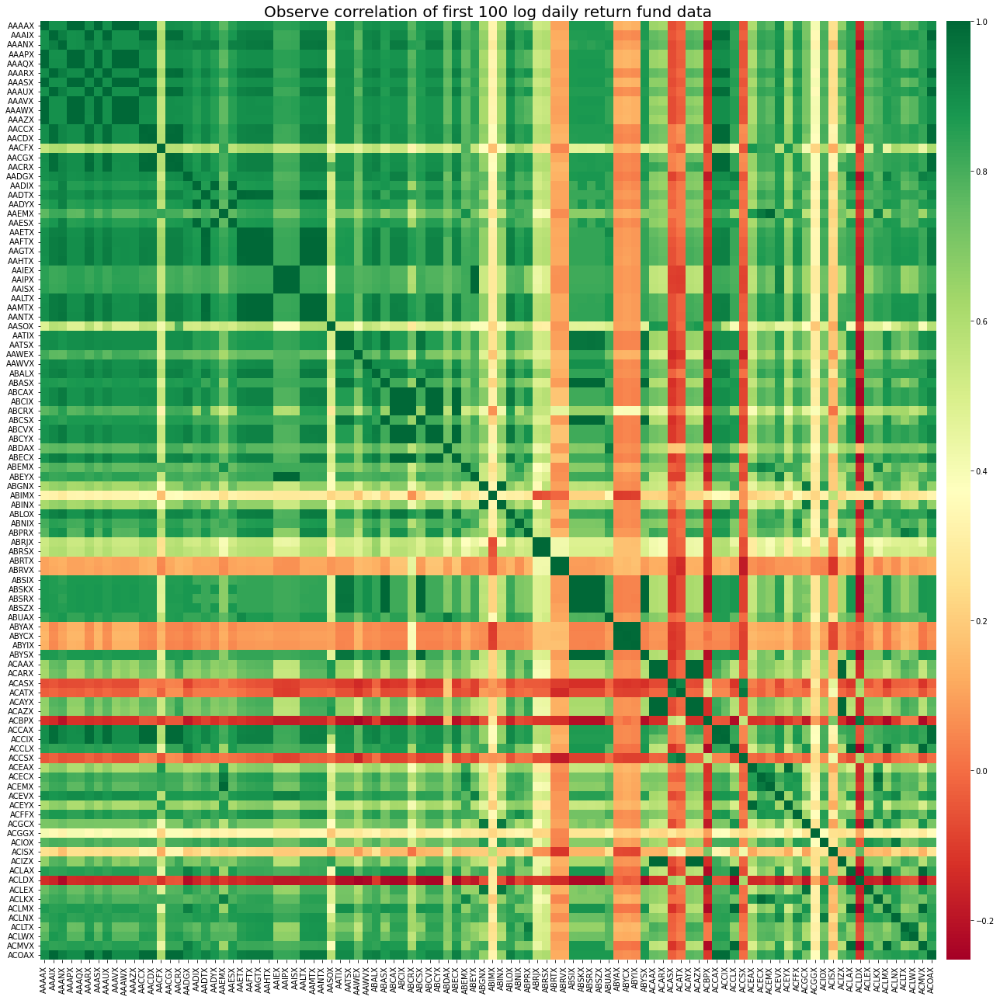

In [21]:
## plot heatmap to observe correlation of selected funds data
nfund=100

_ = plt.figure(figsize=(20,18))
_ = sns.heatmap(log_return.iloc[:,:nfund].corr(), xticklabels=log_return.columns[:nfund], 
                yticklabels=log_return.columns[:nfund],  
                cmap='RdYlGn', cbar=True, cbar_kws={"shrink": 1.0, "aspect": 40, "pad":0.01})
_ = plt.title(f'Observe correlation of first {nfund} log daily return fund data', size=20)
_ = plt.tight_layout()
_ = plt.show()

## Monthly return 

Monthly return is a common return computation especially for horizon analysis, this is due to low volatility relatively to daily return because it takes the daily compound return by averaging out the daily effects, and it contains more valuable information than yearly data. Plus, more investors will choose to adjust their portfolio yearly and seldom monthly, this makes monthly return to be able to provide useful information such as trends for making investment decisions.

Summary statistics are computed for the monthly returns to categorize all funds into 3 horizon sets, years that investors are willing to hold the fund, for analyzing investor risk apetite. There is 1 extreme outliers that are influential to the distributions of the data, thus, the classification is based on 1st and 3rd quartiles rather than mean, plus, the objectives are to keep all funds so that investors can have the freedom to make their own decisions; hence, instead of removing the outliers, this fund is kept.

In [22]:
## compute monthly return
monthly_return = daily_return.resample('M').agg(lambda x: (x+1).prod() - 1)
monthly_return.head()

,AAAAX,AAAIX,AAANX,AAAPX,AAAQX,AAARX,AAASX,AAAUX,AAAVX,AAAWX,...,WWHCX,WWIDX,YACKX,YAFFX,YAFIX,YCGEX,ZDIIX,ZDIVX,ZGEIX,ZSRIX
2019-12-31,0.007590,0.001381,0.001554,0.007634,0.008483,-0.001355,0.007656,0.001387,0.008612,0.007590,...,0.000000,0.000000,0.003922,0.004956,0.004972,0.000937,0.000000,-0.000452,0.0,-0.001988
2020-01-31,-0.001883,-0.006897,-0.018619,-0.002841,-0.002804,-0.005427,-0.001899,-0.006925,-0.002846,-0.001883,...,0.000000,-0.013778,-0.015137,-0.012055,-0.012095,0.005615,-0.019919,-0.019910,0.0,-0.000996
2020-02-29,-0.058491,-0.050000,-0.080632,-0.058879,-0.059044,-0.049113,-0.058991,-0.048815,-0.058040,-0.059434,...,0.000000,-0.078676,-0.072385,-0.069329,-0.069004,-0.075849,-0.096998,-0.096953,0.0,-0.005982
2020-03-31,-0.125251,-0.134503,-0.139295,-0.125126,-0.124502,-0.136298,-0.124368,-0.134897,-0.124242,-0.124373,...,0.000000,-0.166800,-0.142704,-0.141240,-0.141064,-0.147533,-0.137084,-0.137014,0.0,-0.111334
2020-04-30,0.061856,0.099662,0.117882,0.059977,0.060296,0.099668,0.061201,0.100000,0.061130,0.060710,...,0.061968,0.094828,0.094140,0.092991,0.093250,0.103957,0.101363,0.101303,0.0,0.031603


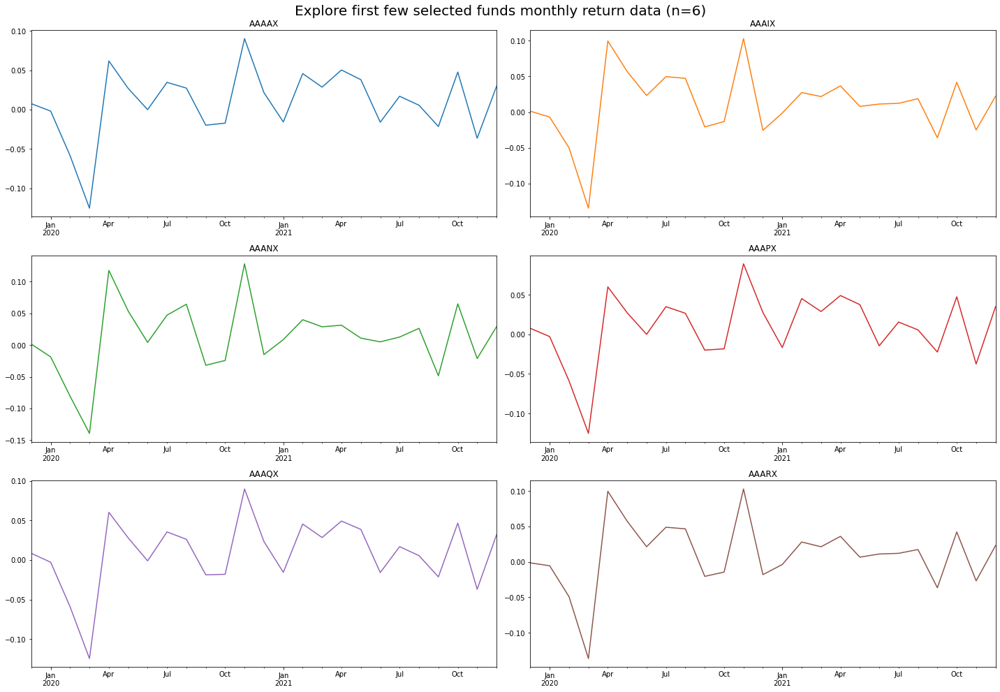

In [23]:
## plot sample of daily return
## initialize number of rows & columns
nrows = 3
ncols = 2

## extract columns fund data name
cols = monthly_return.columns[:nrows*ncols]

## compute colors
colors = plt.rcParams["axes.prop_cycle"]()

## assigne each axis position
idx = [(r, c) for r in range(nrows) for c in range(ncols)]

## plot subplots for selected data
fig, ax = plt.subplots(nrows, ncols,figsize=(20,14))
for i in range(len(cols)):
    c = next(colors)["color"]
    monthly_return[cols[i]].plot(ax=ax[idx[i]], color=c)
    ax[idx[i]].set_title(cols[i])
_ = plt.suptitle(f'Explore first few selected funds monthly return data (n={len(cols)})', size=20)
_ = plt.tight_layout()
_ = plt.show()


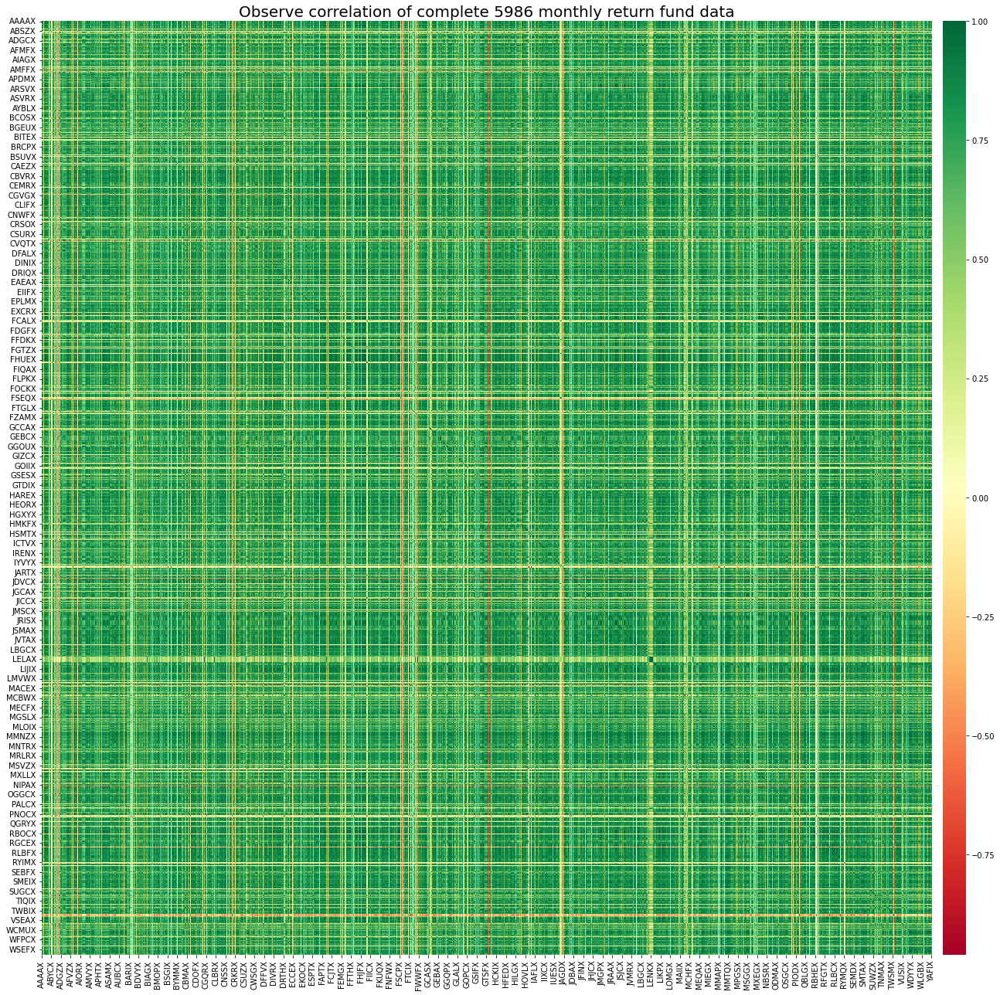

In [24]:
## plot all data for correlation
_ = plt.figure(figsize=(20,18))
_ = sns.heatmap(monthly_return.corr(), 
                cmap='RdYlGn', cbar=True, cbar_kws={"shrink": 1.0, "aspect": 40, "pad":0.01})
_ = plt.title(f'Observe correlation of complete {len(monthly_return.columns)} monthly return fund data', size=20)
_ = plt.tight_layout()
_ = plt.show()

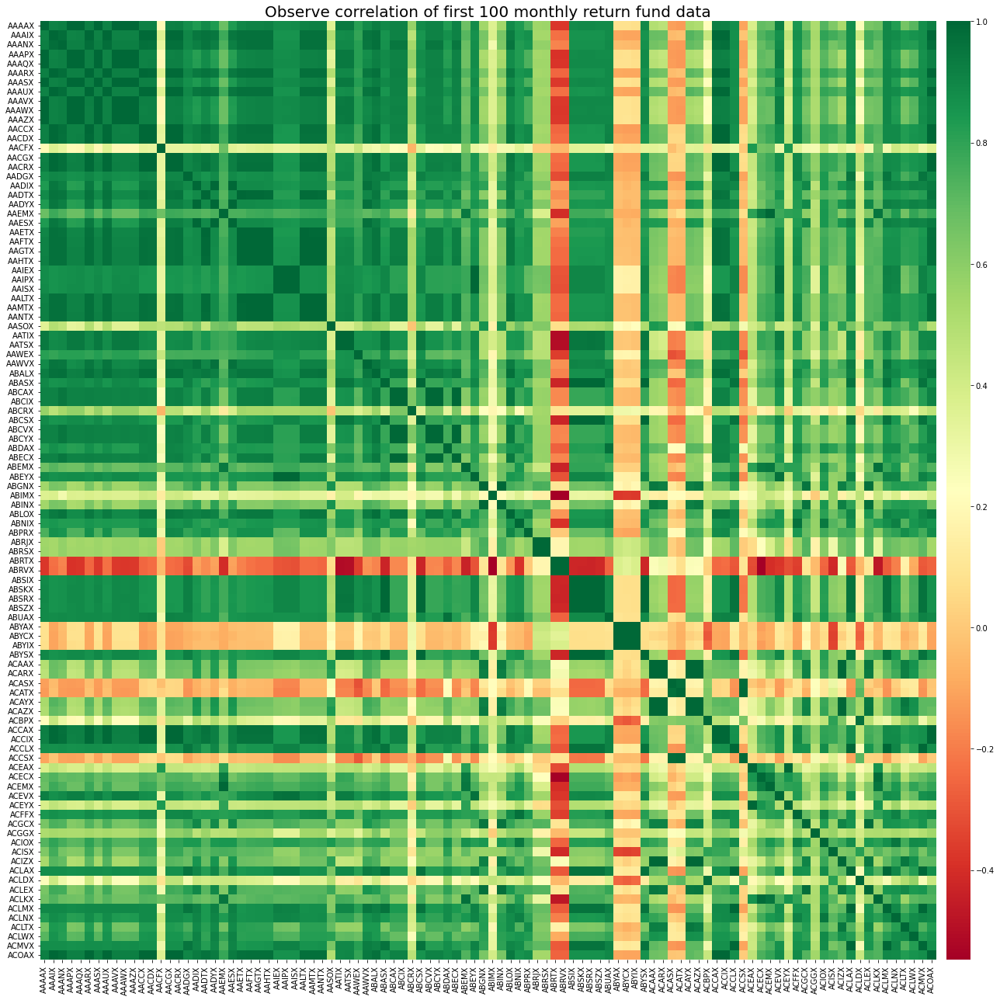

In [25]:
## plot heatmap to observe correlation of selected funds data
nfund=100

_ = plt.figure(figsize=(20,18))
_ = sns.heatmap(monthly_return.iloc[:,:nfund].corr(), xticklabels=monthly_return.columns[:nfund], 
                yticklabels=monthly_return.columns[:nfund],  
                cmap='RdYlGn', cbar=True, cbar_kws={"shrink": 1.0, "aspect": 40, "pad":0.01})
_ = plt.title(f'Observe correlation of first {nfund} monthly return fund data', size=20)
_ = plt.tight_layout()
_ = plt.show()

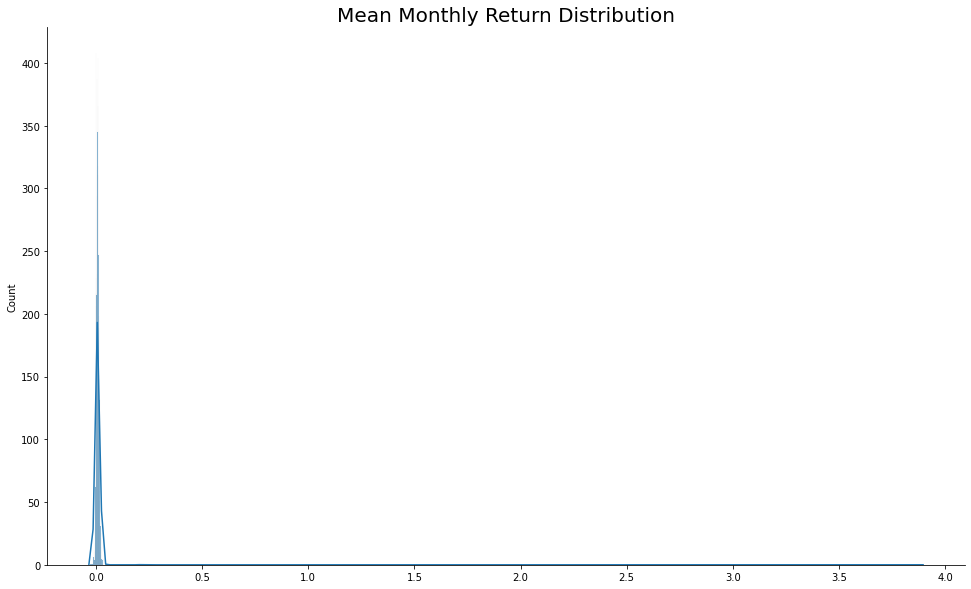

In [26]:
# plot seaborn distribution plot (figure-level plot)
_ = sns.displot(x=monthly_return.mean().to_list(), kde=True,height=8,aspect=1.7)
_ = plt.title("Mean Monthly Return Distribution", size=20)
_ = plt.show()

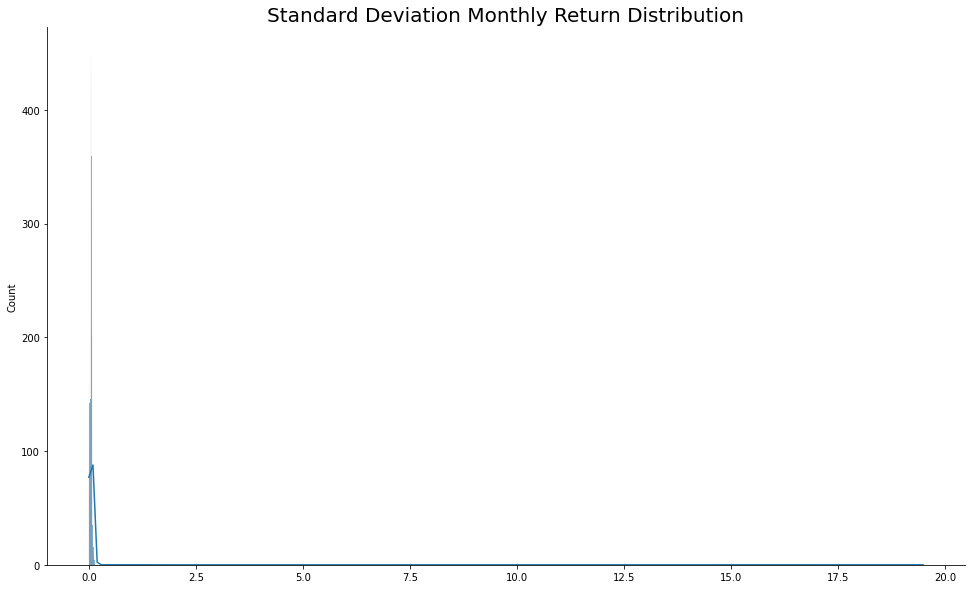

In [27]:
# plot seaborn distribution plot (figure-level plot)
_ = sns.displot(x=monthly_return.std().to_list(), kde=True,height=8,aspect=1.7)
_ = plt.title("Standard Deviation Monthly Return Distribution", size=20)
_ = plt.show()

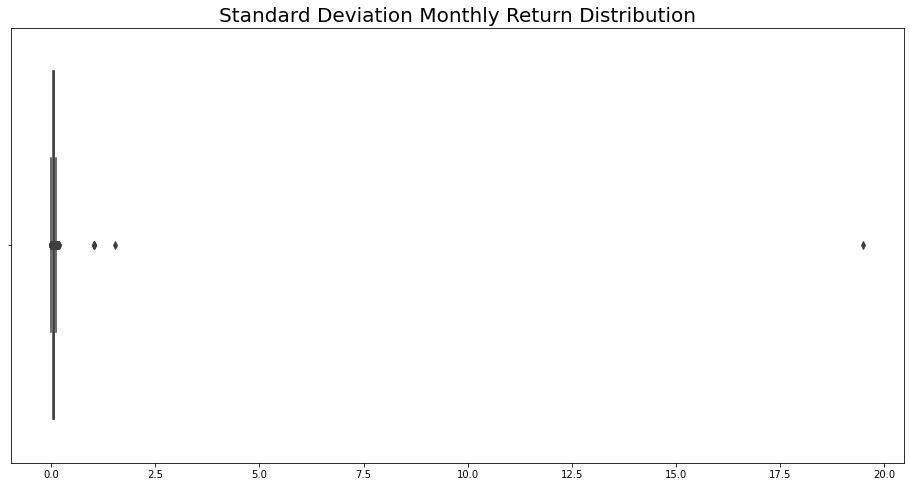

In [28]:
# plot boxplot
_ = plt.figure(figsize=(16,8))
_ = sns.boxplot(x=monthly_return.std().to_list())
_ = plt.title("Standard Deviation Monthly Return Distribution", size=20)
_ = plt.show()

In [29]:
## show sumamry statistics on standard deviation
monthly_return.std().describe()

count    5986.000000
mean        0.056643
std         0.254199
min         0.000289
25%         0.040067
50%         0.054895
75%         0.065438
max        19.491321
dtype: float64

In [30]:
## show percentile data
monthly_std = monthly_return.std()

for i in range(1,11):
    print(f"{i}0-th percentile:\t{monthly_std.quantile(i/10)}")

10-th percentile:	0.017328017587083473
20-th percentile:	0.0348022844214702
30-th percentile:	0.04450329522210605
40-th percentile:	0.05085855842248156
50-th percentile:	0.05489488598111392
60-th percentile:	0.058701084971386625
70-th percentile:	0.06262332077578722
80-th percentile:	0.06846908001209319
90-th percentile:	0.07659668615924609
100-th percentile:	19.491320663480874


In [31]:
## break percentile data into 3
print(f'33-th percentile: {monthly_std.quantile(0.33)}')
print(f'66-th percentile: {monthly_std.quantile(0.66)}')

33-th percentile: 0.047021393710004016
66-th percentile: 0.061114798923655546


In [32]:
## create dataframe for monthly return stdev
monthly_std = monthly_std.to_frame().reset_index()
monthly_std.columns = ['stock_name', 'stdev']
monthly_std['mean'] = monthly_std.mean()
monthly_std['median'] = monthly_std.median()
monthly_std.head()

/tmp/ipykernel_565/499089057.py:4: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  monthly_std['mean'] = monthly_std.mean()
/tmp/ipykernel_565/499089057.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  monthly_std['median'] = monthly_std.median()


,stock_name,stdev,mean,median
0,AAAAX,0.043630,NaN,NaN
1,AAAIX,0.048063,NaN,NaN
2,AAANX,0.056495,NaN,NaN
3,AAAPX,0.043665,NaN,NaN
4,AAAQX,0.043494,NaN,NaN


In [33]:
## assign horizon data to each fund
first_quartile = monthly_std.quantile(0.25).values[0]
third_quartile = monthly_std.quantile(0.75).values[0]

## initialize conditions & values
conditions = [(monthly_std['stdev'] < first_quartile), 
              (monthly_std['stdev'] >= first_quartile) & (monthly_std['stdev'] < third_quartile),
              (monthly_std['stdev'] >= third_quartile)]

values = ['Less than 5 years', '5 - 15 years', 'More than 15 years']

## assign horizon to dataframe
monthly_std['HRZN'] = np.select(conditions, values)
monthly_std.head()

,stock_name,stdev,mean,median,HRZN
0,AAAAX,0.043630,NaN,NaN,5 - 15 years
1,AAAIX,0.048063,NaN,NaN,5 - 15 years
2,AAANX,0.056495,NaN,NaN,5 - 15 years
3,AAAPX,0.043665,NaN,NaN,5 - 15 years
4,AAAQX,0.043494,NaN,NaN,5 - 15 years


In [34]:
## final check
monthly_std['HRZN'].value_counts()

5 - 15 years          2992
Less than 5 years     1497
More than 15 years    1497
Name: HRZN, dtype: int64

---

# Fund Dataset

This section performs the EDA and data preprocessing steps on the most important dataset, which contain features that differentiate each fund from others. Recall that most funds are highly correlated based on prices and returns but are constructed differently from type of companies and weighted differently. Therefore, making this dataset cleaned and fully available will help in providing useful insights for analysis, this includes adding features and removing features that does not meet the objectives.

In [35]:
## expore funds data structure
funds_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6003 entries, 0 to 6002
Data columns (total 29 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Name                                                6003 non-null   object 
 1   Ticker                                              6002 non-null   object 
 2   Morningstar Sustainability Rating                   5993 non-null   float64
 3   Yield (%)                                           5910 non-null   float64
 4   Morningstar Category                                6001 non-null   object 
 5   Portfolio Sustainability Score                      5993 non-null   float64
 6   Portfolio Environmental Score                       5993 non-null   float64
 7   Portfolio Social Score                              5993 non-null   float64
 8   Portfolio Governance Score                          5991 non-null   float64
 9

In [36]:
## explore data that has missing values
funds_data.loc[:,funds_data.columns[funds_data.isnull().sum() > 0]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6003 entries, 0 to 6002
Data columns (total 12 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Ticker                                              6002 non-null   object 
 1   Morningstar Sustainability Rating                   5993 non-null   float64
 2   Yield (%)                                           5910 non-null   float64
 3   Morningstar Category                                6001 non-null   object 
 4   Portfolio Sustainability Score                      5993 non-null   float64
 5   Portfolio Environmental Score                       5993 non-null   float64
 6   Portfolio Social Score                              5993 non-null   float64
 7   Portfolio Governance Score                          5991 non-null   float64
 8   Sustainable Investment - Environmental Sector Fund  5997 non-null   object 
 9

In [37]:
## drop yield, equity style box, fixed income stylebox
funds_data = funds_data.drop(columns=['Yield (%)', 'Equity StyleBox', 'Fixed Income StyleBox'])
funds_data.shape

(6003, 26)

## Working with MISSING DATA

Recall from the data structure information provided above, there are couple of features that is considered to be important for our dashboard, especially for ESG related data. Hence, it is important that these data are filled if possible. Based on the missing value observations, `Morningstar Sustainability Rating`, `Portfolio Sustainability Score`, `Portfolio Environmental Score`, `Portfolio Social Score`, `Portfolio Governance Score`, `Sustainable Investment - Environmental Sector Fund` are some important ESG data that needed to be filled. The criteria for fund removal for this should be based on quality of missing data of these given features, because too much missing data for a particular fund have lower predictive power and might result in misleading result. 

The 11 tickers that contain the same missing data based on the analysis of this sections are 'NSFKX', 'QCGDX', 'RCPAX', 'RCPIX', 'RCPRX', 'RHYAX', 'RGHYX', 'RBIAX', 'RBSIX', 'RBSRX', 'ZSRIX', 'AZEMX'

In [38]:
## collect funds data that have missing values
funds_data[['Name', 'Ticker', 'Morningstar Category', 
           'Morningstar Sustainability Rating',
           'Portfolio Sustainability Score', 'Portfolio Environmental Score', 
           'Portfolio Social Score', 'Portfolio Governance Score', 
           'Sustainable Investment - Environmental Sector Fund'
           ]][funds_data['Portfolio Governance Score'].isnull()]

,Name,Ticker,Morningstar Category,Morningstar Sustainability Rating,Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment - Environmental Sector Fund
331,Natixis Sustainable Future 2050 N,NSFKX,NaN,NaN,NaN,NaN,NaN,NaN,No
453,Quantified Common Ground Investor,QCGDX,NaN,NaN,NaN,NaN,NaN,NaN,No
454,RBC BlueBay Core Plus Bond A,RCPAX,US Fixed Income,NaN,NaN,NaN,NaN,NaN,No
455,RBC BlueBay Core Plus Bond I,RCPIX,US Fixed Income,NaN,NaN,NaN,NaN,NaN,No
456,RBC BlueBay Core Plus Bond R6,RCPRX,US Fixed Income,NaN,NaN,NaN,NaN,NaN,No
457,RBC BlueBay High Yield Bond A,RHYAX,US Fixed Income,NaN,NaN,NaN,NaN,NaN,No
458,RBC BlueBay High Yield Bond I,RGHYX,US Fixed Income,NaN,NaN,NaN,NaN,NaN,No
459,RBC BlueBay Strategic Income A,RBIAX,US Fixed Income,NaN,NaN,NaN,NaN,NaN,No
460,RBC BlueBay Strategic Income I,RBSIX,US Fixed Income,NaN,NaN,NaN,NaN,NaN,No
461,RBC BlueBay Strategic Income R6,RBSRX,US Fixed Income,NaN,NaN,NaN,NaN,NaN,No


In [39]:
## check if data is null
funds_data[funds_data['Ticker'].isnull()]

,Name,Ticker,Morningstar Sustainability Rating,Morningstar Category,Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,...,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Average Market Cap (Mil),Average Credit Quality
4937,JHFunds2 Health Sciences NAV,NaN,3.0,Healthcare Sector Equity,25.44,1.21,11.28,6.53,No,No,...,0.0,0.0,14.26,29.6,19.95,19.6,20.33,411.79,35278.94,A


In [40]:
## observe if data has same missing values
funds_data[['Name', 'Ticker', 'Morningstar Category', 
'Sustainable Investment - Environmental Sector Fund']][funds_data[
    'Sustainable Investment - Environmental Sector Fund'].isnull()]

,Name,Ticker,Morningstar Category,Sustainable Investment - Environmental Sector Fund
2717,DFA Inflation-Protected Securities I,DIPSX,US Fixed Income,NaN
2767,Donoghue Forlines Momentum A,MOJAX,Moderate Allocation,NaN
3017,Federated Hermes Max-Cap Index IS,FISPX,US Equity Large Cap Blend,NaN
3217,Fidelity Advisor������������������ Semi,FIKGX,Technology Sector Equity,NaN
3267,Fidelity Advisor������������������,FWIFX,Global Equity Large Cap,NaN
3367,Fidelity������������������ Diversified I,FDIVX,Global Equity Large Cap,NaN


## Impute Data

Removing observation due to missing value should be the final result. Thus, we have to try to impute reasonable data to make sure that the data can be as complete as possible. After searching the web manually, 2 data has complete information provided from Morningstar site and can be imputed resonably.

In [41]:
## fill missing values
funds_data[funds_data['Ticker'] == 'NSFKX'] =  funds_data[funds_data['Ticker'] == 'NSFKX'].fillna(value={
    'Morningstar Category': 'Target Date', 
    'Morningstar Sustainability Rating': 5.0,
    'Portfolio Sustainability Score': 20.90, 
    'Portfolio Environmental Score': 3.53, 
    'Portfolio Social Score': 8.75,
    'Portfolio Governance Score': 6.81
    })

funds_data[funds_data['Ticker'] == 'QCGDX'] = funds_data[funds_data['Ticker'] == 'QCGDX'].fillna(value={
    'Morningstar Category': 'US Equity Mid Cap', 
    'Morningstar Sustainability Rating': 4.0,
    'Portfolio Sustainability Score': 18.99, 
    'Portfolio Environmental Score': 3.82, 
    'Portfolio Social Score': 6.03,
    'Portfolio Governance Score': 5.07
    })

## observe value
funds_data[funds_data['Ticker'].isin(['NSFKX', 'QCGDX'])]

,Name,Ticker,Morningstar Sustainability Rating,Morningstar Category,Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,...,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Average Market Cap (Mil),Average Credit Quality
331,Natixis Sustainable Future 2050 N,NSFKX,5.0,Target Date,20.90,3.53,8.75,6.81,Yes,Yes,...,0.97,0.09,17.75,37.84,18.19,17.69,12.09,9.9,"53,012.63",BB
453,Quantified Common Ground Investor,QCGDX,4.0,US Equity Mid Cap,18.99,3.82,6.03,5.07,Yes,Yes,...,2.04,0.00,20.46,40.51,26.72,23.52,18.17,111.38,"10,107.80",A


## REMOVE DATA

Based on the observation above, data that does not have the features needed for analysis such as ESG value should be removed, because these funds do not help in our analysis and removing these observations helps to make the analysis to be as accuracte as possible.

In [42]:
## drop Funds that does not have ESG data
funds_data = funds_data.drop(
    index=funds_data[funds_data['Ticker'].isin(
        ['RCPAX', 'RCPIX', 'RCPRX', 'RHYAX', 'RGHYX', 
         'RBIAX', 'RBSIX', 'RBSRX', 'ZSRIX', 'AZEMX'])].index)

funds_data.shape

(5993, 26)

In [43]:
## observes the final imputed data
funds_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5993 entries, 0 to 6002
Data columns (total 26 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Name                                                5993 non-null   object 
 1   Ticker                                              5992 non-null   object 
 2   Morningstar Sustainability Rating                   5993 non-null   float64
 3   Morningstar Category                                5993 non-null   object 
 4   Portfolio Sustainability Score                      5993 non-null   float64
 5   Portfolio Environmental Score                       5993 non-null   float64
 6   Portfolio Social Score                              5993 non-null   float64
 7   Portfolio Governance Score                          5993 non-null   float64
 8   Sustainable Investment by Prospectus                5993 non-null   object 
 9

## Compare both funds & price datasets

There are total of 5993 funds in the fund dataset whereas there are total of 5986 funds in the price dataset. The ideal final dataset for analysis is to be able to merge both price and final datasets by fund tickers, which means that both datasets should have same amount of funds data, but because the primarily dataset is the funds dataset and price dataset is only for support; therefore, the price dataset that does not have data in the funds dataset are removed but data in the funds dataset that are not in price dataset is kept for further analysis.

In [44]:
## check data does not exist in price dataset but in fund dataset
price_drop = set(monthly_std['stock_name'].to_list()) - set(funds_data['Ticker'].to_list())
price_drop

{'ABIMX',
 'ALAFX',
 'AZEMX',
 'LPEIX',
 'RBIAX',
 'RBSIX',
 'RBSRX',
 'RCPAX',
 'RCPIX',
 'RCPRX',
 'RGHYX',
 'RHYAX',
 'ZSRIX'}

In [45]:
## remove the tickers shown above from price dataset
monthly_std = monthly_std.drop(
    index=monthly_std[monthly_std['stock_name'].isin(price_drop)].index)

monthly_std.shape

(5973, 5)

In [46]:
## remove the tickers shown above from price dataset
daily_return = daily_return.drop(columns=price_drop)

daily_return.shape

(505, 5973)

In [47]:
## remove the tickers shown above from price dataset
daily_cumreturn = daily_cumreturn.drop(columns=price_drop)

daily_cumreturn.shape

(505, 5973)

In [48]:
## remove the tickers shown above from price dataset
log_return = log_return.drop(columns=price_drop)

log_return.shape

(505, 5973)

In [49]:
## check data does not exist in fund dataset but in price dataset
set(funds_data['Ticker'].to_list()) - set(monthly_std['stock_name'].to_list())

{'ATEZX',
 'BIRKX',
 'BRZAX',
 'BRZKX',
 'JAAAX',
 'JCLAX',
 'JCUNX',
 'JCURX',
 'JOBIX',
 'JOEAX',
 'JOEIX',
 'JOEMX',
 'JOFIX',
 'JOIIX',
 'MNCSX',
 'TAJEX',
 'TAKJX',
 'TAPKX',
 'TAQOX',
 nan}

In [50]:
## check all tickers not in both datasets
len(set(funds_data['Ticker'].to_list()).symmetric_difference(set(monthly_std['stock_name'].to_list())))

20

## Identify noncharacter data

One serious issue that was identified when working with the fund dataset performed above is the name of the funds, where total of 538 funds name needed for further analysis consists of unidentified characters. The team try to look for any datasets or API financial resources that can perform this replacement quick and easy; however, none are found. The team then decided to perform manual replacements for all of these 538 funds

Below presented steps to calculate the number of funds that has noncharacter data.

In [51]:
## remove all chars to identify weird chars
pattern = re.compile("[^\w\d\s\-\&\/\.\'\:\(\)\%]")

funds_data['NonChar'] = funds_data['Name'].apply(lambda x: 1 if pattern.search(x) else 0)

## observe the data
funds_data[['Name', 'Ticker', 'Morningstar Category', 
'Sustainable Investment - Environmental Sector Fund']][
    funds_data['NonChar'] == 1][500:]

,Name,Ticker,Morningstar Category,Sustainable Investment - Environmental Sector Fund
4062,GuidePath������������������ Conservative Allo,GITTX,Cautious Allocation,No
4063,GuidePath������������������ Conservative Al,GPTCX,Cautious Allocation,No
4064,Guidepath������������������ Growt,GPIGX,US Equity Large Cap Value,No
4065,GuidePath������������������ Tactical Allo,GITUX,Moderate Allocation,No
4066,GuidePath������������������ Tactical Al,GPTUX,Moderate Allocation,No
4093,Guinness Atkinson���������������������������,IWIRX,US Equity Large Cap Growth,No
5096,JPMorgan SmartRetirement�������������,JNSAX,Target Date,No
5097,JPMorgan SmartRetirement�������������,JNSSX,Target Date,No
5098,JPMorgan SmartRetirement��������������,JNSIX,Target Date,No
5099,JPMorgan SmartRetirement�������������,JSMAX,Target Date,No


In [52]:
## compute total amount of noncharacters in the fund names
len(funds_data['Ticker'][funds_data['NonChar'] == 1].to_list())

538

In [53]:
## observe noncharacter tickers is in the difference set, ie, not in both datasets
set(funds_data['Ticker'].to_list()).symmetric_difference(set(monthly_std['stock_name'].to_list())) & set(funds_data['Ticker'][funds_data['NonChar'] == 1].to_list())

set()

## Cleaning the funds name 

Recall that there are total of 538 funds needed to be cleaned so that the funds name is human readable. These are done by searching all funds ticker manually online and collecting those names which are collected into `tickerNameNeedFill_first.csv` and `tickerNameNeedFill_second.csv`.

In [54]:
## observe index for replacement
fill2_data[fill2_data['Complete Fund Name'].isnull() != True]

,Unnamed: 0,Name,Ticker,Complete Fund Name
178,3184,Fidelity Advisor Invest,FGBAX,Fidelity Advisor Investment Grade Bond Fund Cl...
179,3185,Fidelity Advisor Invest,FGBPX,Fidelity Advisor Investment Grade Bond Fund Cl...
180,3186,Fidelity Advisor Invest,FGBTX,Fidelity Advisor Investment Grade Bond Fund Cl...
181,3187,Fidelity Advisor Invest,FIKQX,Fidelity Advisor Investment Grade Bond Fund Cl...
182,3188,Fidelity Advisor,FPJAX,Fidelity Advisor Japan Fund Class A
...,...,...,...,...
533,5123,JPMorgan SmartRetirement B,JOBYX,JPMorgan SmartRetirement Blend 2040 Fund Clas...
534,5372,MainStay Cushing M,CSHAX,MainStay Cushing MLP Premier Fund Class A
535,5373,MainStay Cushing M,CSHCX,MainStay Cushing MLP Premier Fund Class C
536,5374,MainStay Cushing M,CSHZX,MainStay Cushing MLP Premier Fund Class I


In [55]:
## make sure first dataset does not overspill
fill1_data[:180]

,Unnamed: 0,Name,Ticker
0,199,Fidelity Sustainability U.S. Equity Fund Class A,FSEKX
1,200,Fidelity Sustainability U.S. Equity Fund Class C,FSEOX
2,201,Fidelity Sustainability U.S. Equity Fund Class I,FSEQX
3,202,Fidelity Sustainability U.S. Equity Fund Class M,FSEPX
4,203,Fidelity Sustainability U.S. Equity Fund,FSEBX
...,...,...,...
175,3181,Fidelity Advisor® International Small Cap Fund...,FIXIX
176,3182,Fidelity Advisor® International Small Cap Fund...,FTISX
177,3183,Fidelity Advisor® International Small Cap Fund...,FIQIX
178,3184,Fidelity Advisor® Investment Grade Bond Fund C...,FGBAX


In [56]:
## manipulate 2nd dataset
fill2_data.loc[179:, 'Name'] = fill2_data.loc[179:, 'Complete Fund Name']
fill2_data.loc[179:]

,Unnamed: 0,Name,Ticker,Complete Fund Name
179,3185,Fidelity Advisor Investment Grade Bond Fund Cl...,FGBPX,Fidelity Advisor Investment Grade Bond Fund Cl...
180,3186,Fidelity Advisor Investment Grade Bond Fund Cl...,FGBTX,Fidelity Advisor Investment Grade Bond Fund Cl...
181,3187,Fidelity Advisor Investment Grade Bond Fund Cl...,FIKQX,Fidelity Advisor Investment Grade Bond Fund Cl...
182,3188,Fidelity Advisor Japan Fund Class A,FPJAX,Fidelity Advisor Japan Fund Class A
183,3189,Fidelity Advisor Japan Fund Class C,FJPCX,Fidelity Advisor Japan Fund Class C
...,...,...,...,...
533,5123,JPMorgan SmartRetirement Blend 2040 Fund Clas...,JOBYX,JPMorgan SmartRetirement Blend 2040 Fund Clas...
534,5372,MainStay Cushing MLP Premier Fund Class A,CSHAX,MainStay Cushing MLP Premier Fund Class A
535,5373,MainStay Cushing MLP Premier Fund Class C,CSHCX,MainStay Cushing MLP Premier Fund Class C
536,5374,MainStay Cushing MLP Premier Fund Class I,CSHZX,MainStay Cushing MLP Premier Fund Class I


In [57]:
## add first dataset to second dataset
fill2_data.loc[:179, 'Name'] = fill1_data.loc[:179, 'Name']
fill2_data.loc[:179]

,Unnamed: 0,Name,Ticker,Complete Fund Name
0,199,Fidelity Sustainability U.S. Equity Fund Class A,FSEKX,NaN
1,200,Fidelity Sustainability U.S. Equity Fund Class C,FSEOX,NaN
2,201,Fidelity Sustainability U.S. Equity Fund Class I,FSEQX,NaN
3,202,Fidelity Sustainability U.S. Equity Fund Class M,FSEPX,NaN
4,203,Fidelity Sustainability U.S. Equity Fund,FSEBX,NaN
...,...,...,...,...
175,3181,Fidelity Advisor® International Small Cap Fund...,FIXIX,NaN
176,3182,Fidelity Advisor® International Small Cap Fund...,FTISX,NaN
177,3183,Fidelity Advisor® International Small Cap Fund...,FIQIX,NaN
178,3184,Fidelity Advisor® Investment Grade Bond Fund C...,FGBAX,Fidelity Advisor Investment Grade Bond Fund Cl...


In [58]:
## now drop the unneeded columns
fill2_data.drop(columns='Complete Fund Name', inplace=True)
fill2_data

,Unnamed: 0,Name,Ticker
0,199,Fidelity Sustainability U.S. Equity Fund Class A,FSEKX
1,200,Fidelity Sustainability U.S. Equity Fund Class C,FSEOX
2,201,Fidelity Sustainability U.S. Equity Fund Class I,FSEQX
3,202,Fidelity Sustainability U.S. Equity Fund Class M,FSEPX
4,203,Fidelity Sustainability U.S. Equity Fund,FSEBX
...,...,...,...
533,5123,JPMorgan SmartRetirement Blend 2040 Fund Clas...,JOBYX
534,5372,MainStay Cushing MLP Premier Fund Class A,CSHAX
535,5373,MainStay Cushing MLP Premier Fund Class C,CSHCX
536,5374,MainStay Cushing MLP Premier Fund Class I,CSHZX


In [59]:
## collect tickers to list for cleaning
tick_ls = fill2_data['Ticker'].to_list()
len(tick_ls)

538

In [60]:
## replace name based on ticker
for tick in tick_ls:
  funds_data.loc[funds_data[funds_data['Ticker'] == tick].index[0], 'Name'] = fill2_data['Name'][fill2_data['Ticker'] == tick].values[0]

## remove all chars to identify weird chars
pattern = re.compile("[^\w\d\s\-\&\/\.\'\:\(\)\%]")

funds_data['NonChar'] = funds_data['Name'].apply(lambda x: 1 if pattern.search(x) else 0)
funds_data[['Name', 'Ticker']][funds_data['NonChar'] == 1]

,Name,Ticker
395,PFG Fidelity Institutional AM® Bond ESG Strate...,PFFBX
396,PFG Invesco® Thematic ESG Strategy Class R Shares,PFIOX
397,PFG Janus Henderson® Balanced Strategy Class R...,PFJHX
723,AC Alternatives® Market Neutral Value Fund A C...,ACVQX
724,AC Alternatives® Market Neutral Value Fund C C...,ACVHX
...,...,...
3580,Franklin LifeSmart 2040 Retirement Target Fun...,FLSHX
3581,Franklin LifeSmart 2040 Retirement Target Fun...,FLREX
3582,Franklin LifeSmart 2045 Retirement Target Fun...,FMLTX
3583,Franklin LifeSmart 2050 Retirement Target Fun...,FRLEX


In [61]:
## observe data and make sure name is cleaned up
funds_data[['Name', 'Ticker']][funds_data['NonChar'] == 1][:100]

,Name,Ticker
395,PFG Fidelity Institutional AM® Bond ESG Strate...,PFFBX
396,PFG Invesco® Thematic ESG Strategy Class R Shares,PFIOX
397,PFG Janus Henderson® Balanced Strategy Class R...,PFJHX
723,AC Alternatives® Market Neutral Value Fund A C...,ACVQX
724,AC Alternatives® Market Neutral Value Fund C C...,ACVHX
...,...,...
3109,Fidelity Advisor Freedom® 2055 Fund Class A,FHFAX
3110,Fidelity Advisor Freedom® 2055 Fund Class I,FHFIX
3111,Fidelity Advisor Freedom® 2055 Fund Class M,FHFTX
3112,Fidelity Advisor Freedom® 2055 Fund Class Z,FIJSX


In [62]:
## notice that further cleaning is still needed
funds_data[['Name', 'Ticker']][funds_data['NonChar'] == 1][100:]

,Name,Ticker
3114,Fidelity Advisor Freedom® 2060 Fund Class A,FDKPX
3115,Fidelity Advisor Freedom® 2060 Fund Class I,FDKQX
3116,Fidelity Advisor Freedom® 2060 Fund Class M,FDKTX
3117,Fidelity Advisor Freedom® 2060 Fund Class Z,FIJTX
3118,Fidelity Advisor Freedom® 2060 Fund Class Z6,FNGLX
...,...,...
3580,Franklin LifeSmart 2040 Retirement Target Fun...,FLSHX
3581,Franklin LifeSmart 2040 Retirement Target Fun...,FLREX
3582,Franklin LifeSmart 2045 Retirement Target Fun...,FMLTX
3583,Franklin LifeSmart 2050 Retirement Target Fun...,FRLEX


In [63]:
## clean those that are not readable characters
funds_data.loc[funds_data[funds_data['NonChar'] == 1].index, 'Name'] = \
    funds_data.loc[funds_data[funds_data['NonChar'] == 1].index, 'Name'].apply(
        lambda x: re.sub(pattern, '', x))

funds_data[['Name', 'Ticker']][funds_data['NonChar'] == 1]

,Name,Ticker
395,PFG Fidelity Institutional AM Bond ESG Strateg...,PFFBX
396,PFG Invesco Thematic ESG Strategy Class R Shares,PFIOX
397,PFG Janus Henderson Balanced Strategy Class R ...,PFJHX
723,AC Alternatives Market Neutral Value Fund A Class,ACVQX
724,AC Alternatives Market Neutral Value Fund C Class,ACVHX
...,...,...
3580,Franklin LifeSmart 2040 Retirement Target Fund...,FLSHX
3581,Franklin LifeSmart 2040 Retirement Target Fund...,FLREX
3582,Franklin LifeSmart 2045 Retirement Target Fund...,FMLTX
3583,Franklin LifeSmart 2050 Retirement Target Fund...,FRLEX


## Encoding data into dummy variables for analysis

When observing the fund dataset, some of the ESG data seems to be really useful for users when trying to understand which ESG funds better tailored the investors using our analysis. The primarily ESG scores are `Portfolio Environmental Score`, `Portfolio Social Score`, `Portfolio Governance Score`, and `Portfolio Sustainability Score`. Some other features - `Average Credit Quality`, `Morningstar Category`, `HRZN` - can be used to identify risk tolerance level and investment preferences for investors. Hence, this section creates additional features to enrich the final datasets for analysis. 

Two created features - `Fund_location` & `Fund_Type` - do not have additional dummy encoding features. The rest of the features created additional 1 categorical feature and 3 dummy features. Thus, total of 26 additional features are created from this analysis.

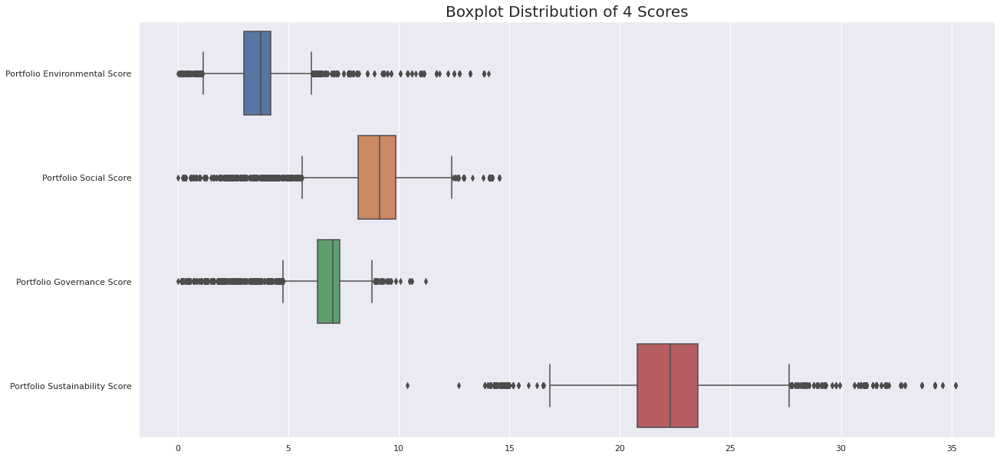

In [64]:
## plot box plots to observe the distributions
## extract columns fund data name
cols = ['Portfolio Environmental Score', 'Portfolio Social Score', 'Portfolio Governance Score', 'Portfolio Sustainability Score']

_ = plt.figure(figsize=(20,10))
_ = sns.set_theme()
_ = sns.boxplot(data=funds_data[cols], orient="h")
_ = plt.title(f'Boxplot Distribution of 4 Scores', size=20)
_ = plt.show()


In [65]:
## ENVIRONMENTAL PREFERENCE create categorical variable
funds_data['Environmental Preference'] = None 

funds_data.loc[funds_data[funds_data['Portfolio Environmental Score'] < 
          funds_data['Portfolio Environmental Score'].quantile(0.25)].index, 
       'Environmental Preference'] = 'MILD'

funds_data.loc[funds_data[(funds_data['Portfolio Environmental Score'] >= 
           funds_data['Portfolio Environmental Score'].quantile(0.25)) & 
          (funds_data['Portfolio Environmental Score'] < 
           funds_data['Portfolio Environmental Score'].quantile(0.75))].index, 
       'Environmental Preference'] = 'MODERATE'

funds_data.loc[funds_data[funds_data['Portfolio Environmental Score'] >= 
          funds_data['Portfolio Environmental Score'].quantile(0.75)].index, 
       'Environmental Preference'] = 'STRONG'

funds_data['Environmental Preference'].value_counts()

MODERATE    2984
STRONG      1520
MILD        1489
Name: Environmental Preference, dtype: int64

In [66]:
## ENVIRONMENTAL PREFERENCE DUMMY Encoded
funds_data['Environmental Preference MILD'] = 1 
funds_data['Environmental Preference MODERATE'] = 0 
funds_data['Environmental Preference STRONG'] = 0 

funds_data.loc[funds_data[(funds_data['Portfolio Environmental Score'] >= 
           funds_data['Portfolio Environmental Score'].quantile(0.25))].index, 
       'Environmental Preference MODERATE'] = 1

funds_data.loc[funds_data[funds_data['Portfolio Environmental Score'] >= 
          funds_data['Portfolio Environmental Score'].quantile(0.75)].index, 
       'Environmental Preference STRONG'] = 1

funds_data[['Environmental Preference MILD', 'Environmental Preference MODERATE', 'Environmental Preference STRONG']].sum()

Environmental Preference MILD        5993
Environmental Preference MODERATE    4504
Environmental Preference STRONG      1520
dtype: int64

In [67]:
## SOCIAL PREFERENCE create categorical variable
funds_data['Social Preference'] = None 

funds_data.loc[funds_data[funds_data['Portfolio Social Score'] < 
          funds_data['Portfolio Social Score'].quantile(0.25)].index, 
       'Social Preference'] = 'MILD'

funds_data.loc[funds_data[(funds_data['Portfolio Social Score'] >= 
           funds_data['Portfolio Social Score'].quantile(0.25)) & 
          (funds_data['Portfolio Social Score'] < 
           funds_data['Portfolio Social Score'].quantile(0.75))].index, 
       'Social Preference'] = 'MODERATE'

funds_data.loc[funds_data[funds_data['Portfolio Social Score'] >= 
          funds_data['Portfolio Social Score'].quantile(0.75)].index, 
       'Social Preference'] = 'STRONG'

funds_data['Social Preference'].value_counts()

MODERATE    2986
STRONG      1512
MILD        1495
Name: Social Preference, dtype: int64

In [68]:
## SOCIAL PREFERENCE DUMMY Encoded
funds_data['Social Preference MILD'] = 1 
funds_data['Social Preference MODERATE'] = 0 
funds_data['Social Preference STRONG'] = 0 

funds_data.loc[funds_data[(funds_data['Portfolio Social Score'] >= 
           funds_data['Portfolio Social Score'].quantile(0.25))].index, 
       'Social Preference MODERATE'] = 1

funds_data.loc[funds_data[funds_data['Portfolio Social Score'] >= 
          funds_data['Portfolio Social Score'].quantile(0.75)].index, 
       'Social Preference STRONG'] = 1

funds_data[['Social Preference MILD', 'Social Preference MODERATE', 'Social Preference STRONG']].sum()

Social Preference MILD        5993
Social Preference MODERATE    4498
Social Preference STRONG      1512
dtype: int64

In [69]:
## GOVERNANCE PREFERENCE create categorical variable
funds_data['Governance Preference'] = None 

funds_data.loc[funds_data[funds_data['Portfolio Governance Score'] < 
          funds_data['Portfolio Governance Score'].quantile(0.25)].index, 
       'Governance Preference'] = 'MILD'

funds_data.loc[funds_data[(funds_data['Portfolio Governance Score'] >= 
           funds_data['Portfolio Governance Score'].quantile(0.25)) & 
          (funds_data['Portfolio Governance Score'] < 
           funds_data['Portfolio Governance Score'].quantile(0.75))].index, 
       'Governance Preference'] = 'MODERATE'

funds_data.loc[funds_data[funds_data['Portfolio Governance Score'] >= 
          funds_data['Portfolio Governance Score'].quantile(0.75)].index, 
       'Governance Preference'] = 'STRONG'

funds_data['Governance Preference'].value_counts()

MODERATE    2981
STRONG      1517
MILD        1495
Name: Governance Preference, dtype: int64

In [70]:
## GOVERNANCE PREFERENCE DUMMY ENCODED
funds_data['Governance Preference MILD'] = 1 
funds_data['Governance Preference MODERATE'] = 0 
funds_data['Governance Preference STRONG'] = 0 

funds_data.loc[funds_data[(funds_data['Portfolio Governance Score'] >= 
           funds_data['Portfolio Governance Score'].quantile(0.25))].index, 
       'Governance Preference MODERATE'] = 1

funds_data.loc[funds_data[funds_data['Portfolio Governance Score'] >= 
          funds_data['Portfolio Governance Score'].quantile(0.75)].index, 
       'Governance Preference STRONG'] = 1

funds_data[['Governance Preference MILD', 'Governance Preference MODERATE', 'Governance Preference STRONG']].sum()

Governance Preference MILD        5993
Governance Preference MODERATE    4498
Governance Preference STRONG      1517
dtype: int64

In [71]:
## SUSTAINABILITY PREFERENCE create categorical variable
funds_data['Sustainability Preference'] = None 

funds_data.loc[funds_data[funds_data['Portfolio Sustainability Score'] < 
          funds_data['Portfolio Sustainability Score'].quantile(0.25)].index, 
       'Sustainability Preference'] = 'MILD'

funds_data.loc[funds_data[(funds_data['Portfolio Sustainability Score'] >= 
           funds_data['Portfolio Sustainability Score'].quantile(0.25)) & 
          (funds_data['Portfolio Sustainability Score'] < 
           funds_data['Portfolio Sustainability Score'].quantile(0.75))].index, 
       'Sustainability Preference'] = 'MODERATE'

funds_data.loc[funds_data[funds_data['Portfolio Sustainability Score'] >= 
          funds_data['Portfolio Sustainability Score'].quantile(0.75)].index, 
       'Sustainability Preference'] = 'STRONG'

funds_data['Sustainability Preference'].value_counts()

MODERATE    2976
STRONG      1522
MILD        1495
Name: Sustainability Preference, dtype: int64

In [72]:
## SUSTAINABILITY PREFERENCE DUMMY Encoded
funds_data['Sustainability Preference MILD'] = 1 
funds_data['Sustainability Preference MODERATE'] = 0 
funds_data['Sustainability Preference STRONG'] = 0 

funds_data.loc[funds_data[(funds_data['Portfolio Sustainability Score'] >= 
           funds_data['Portfolio Sustainability Score'].quantile(0.25))].index, 
       'Sustainability Preference MODERATE'] = 1

funds_data.loc[funds_data[funds_data['Portfolio Sustainability Score'] >= 
          funds_data['Portfolio Sustainability Score'].quantile(0.75)].index, 
       'Sustainability Preference STRONG'] = 1

funds_data[['Sustainability Preference MILD', 'Sustainability Preference MODERATE', 'Sustainability Preference STRONG']].sum()

Sustainability Preference MILD        5993
Sustainability Preference MODERATE    4498
Sustainability Preference STRONG      1522
dtype: int64

In [73]:
## RISK TOLERANCE create categorical variable
funds_data['RISK TOLERANCE'] = None

funds_data.loc[funds_data[(funds_data['Average Credit Quality'] == 'AAA') | 
          (funds_data['Average Credit Quality'] == 'AA')].index, 
       'RISK TOLERANCE'] = 'LOW'

funds_data.loc[funds_data[(funds_data['Average Credit Quality'] == 'A') | 
          (funds_data['Average Credit Quality'] == 'BBB')].index, 
       'RISK TOLERANCE'] = 'MODERATE'

funds_data.loc[funds_data[(funds_data['Average Credit Quality'] == 'BB') | 
          (funds_data['Average Credit Quality'] == 'B')].index, 
       'RISK TOLERANCE'] = 'HIGH'

funds_data['RISK TOLERANCE'].value_counts()

MODERATE    3085
HIGH        1935
LOW          973
Name: RISK TOLERANCE, dtype: int64

In [74]:
## RISK TOLERANCE DUMMY ENCODED
funds_data['RISK TOLERANCE HIGH'] = 1
funds_data['RISK TOLERANCE MEDIUM'] = 0
funds_data['RISK TOLERANCE LOW'] = 0

funds_data.loc[funds_data[(funds_data['Average Credit Quality'] == 'AAA') | 
          (funds_data['Average Credit Quality'] == 'AA')].index, 
       'RISK TOLERANCE LOW'] = 1

funds_data.loc[funds_data[(funds_data['Average Credit Quality'] == 'AAA') | 
          (funds_data['Average Credit Quality'] == 'AA') | 
          (funds_data['Average Credit Quality'] == 'A') | 
          (funds_data['Average Credit Quality'] == 'BBB')].index, 
       'RISK TOLERANCE MEDIUM'] = 1

funds_data[['RISK TOLERANCE LOW', 'RISK TOLERANCE MEDIUM', 'RISK TOLERANCE HIGH']].sum()

RISK TOLERANCE LOW        973
RISK TOLERANCE MEDIUM    4058
RISK TOLERANCE HIGH      5993
dtype: int64

In [75]:
## Categorized funds as US or Global
pattern = re.compile('US')

funds_data['Fund_Location'] = funds_data['Morningstar Category'].apply(lambda x: 'US fund' if pattern.search(x) else 'Global Fund')
funds_data['Fund_Location'].value_counts()

Global Fund    3439
US fund        2554
Name: Fund_Location, dtype: int64

In [76]:
## Categorized fixed income + equity + mixed

def allocation(x):
  '''Allocate funds type based on Fund category

  Args: str
    x: Morningstar Category

  Returns: str
    3 types of fund: Equity, Fixed Income, Mixed

  '''
  pat1 = re.compile('Equity')
  pat2 = re.compile('Fixed Income')

  if pat1.search(x):
    return 'Equity'
  elif pat2.search(x):
    return 'Fixed Income'
  else:
    return 'Mixed'

funds_data['Fund_Type'] = funds_data['Morningstar Category'].apply(lambda x: allocation(x))
funds_data['Fund_Type'].value_counts()

Equity          3794
Mixed           1527
Fixed Income     672
Name: Fund_Type, dtype: int64

In [77]:
## Horizon Dummy Encoding
monthly_std['HRZN LT 5-yr'] = 1
monthly_std['HRZN 5 to 15'] = 0
monthly_std['HRZN GT 15-yr'] = 0

monthly_std.loc[monthly_std[monthly_std['HRZN'] != 'Less than 5 years'].index, 'HRZN 5 to 15'] = 1
monthly_std.loc[monthly_std[monthly_std['HRZN'] == 'More than 15 years'].index, 'HRZN GT 15-yr'] = 1

monthly_std[['HRZN LT 5-yr', 'HRZN 5 to 15', 'HRZN GT 15-yr']].sum()

HRZN LT 5-yr     5973
HRZN 5 to 15     4486
HRZN GT 15-yr    1496
dtype: int64

# Output Dataset

Total of 6 datasets are created based on this prelimary analysis.
1. `fundsDummy.csv` - Primarily dataset that contain features about each ESG funds with total of 5993 observations and 49 features
2. `horizonDummy.csv` - Secondary dataset that contain funds' horizon features for risk analysis with 5973 funds
3. `prices.csv` - Supplementary dataset that contain prices data from 2019-12-24 to 2021-12-23 with 5973 funds
4. `log_return.csv` - Supplementary dataset that contain log daily return data from 2019-12-24 to 2021-12-23 with 5973 funds
5. `daily_return.csv` - Supplementary dataset that contain daily return data from 2019-12-24 to 2021-12-23 with 5973 funds
6. `cumulative_return.csv` - Supplementary dataset that contain daily cumulative return data from 2019-12-24 to 2021-12-23 with 5973 funds

These datasets maybe use or not used based on the machine learning analysis team's decision when performing different kind/set of analysis.

In [78]:
## observe funds dataset structure
funds_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5993 entries, 0 to 6002
Data columns (total 49 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Name                                                5993 non-null   object 
 1   Ticker                                              5992 non-null   object 
 2   Morningstar Sustainability Rating                   5993 non-null   float64
 3   Morningstar Category                                5993 non-null   object 
 4   Portfolio Sustainability Score                      5993 non-null   float64
 5   Portfolio Environmental Score                       5993 non-null   float64
 6   Portfolio Social Score                              5993 non-null   float64
 7   Portfolio Governance Score                          5993 non-null   float64
 8   Sustainable Investment by Prospectus                5993 non-null   object 
 9

In [79]:
## observe monthly dataset structure
monthly_std.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5973 entries, 0 to 5984
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   stock_name     5973 non-null   object 
 1   stdev          5973 non-null   float64
 2   mean           0 non-null      float64
 3   median         0 non-null      float64
 4   HRZN           5973 non-null   object 
 5   HRZN LT 5-yr   5973 non-null   int64  
 6   HRZN 5 to 15   5973 non-null   int64  
 7   HRZN GT 15-yr  5973 non-null   int64  
dtypes: float64(3), int64(3), object(2)
memory usage: 549.0+ KB


In [80]:
## transpose price data & check data structure
price_data.T.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5986 entries, AAAAX to ZSRIX
Columns: 505 entries, 2019-12-24 to 2021-12-23
dtypes: float64(505)
memory usage: 23.2+ MB


In [81]:
## check daily return
daily_return.T.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5973 entries, AAAAX to ZGEIX
Columns: 505 entries, 2019-12-24 to 2021-12-23
dtypes: float64(505)
memory usage: 23.1+ MB


In [82]:
## check cumulative return
daily_cumreturn.T.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5973 entries, AAAAX to ZGEIX
Columns: 505 entries, 2019-12-24 to 2021-12-23
dtypes: float64(505)
memory usage: 23.1+ MB


In [83]:
## check log return
log_return.T.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5973 entries, AAAAX to ZGEIX
Columns: 505 entries, 2019-12-24 to 2021-12-23
dtypes: float64(505)
memory usage: 23.1+ MB


In [84]:
## output data
## uncomment to output data
# funds_data.to_csv('fundsDummy.csv')
# monthly_std.to_csv('horizonDummy.csv')
# price_data.T.to_csv('prices.csv')
# log_return.T.to_csv('log_return.csv')
# daily_return.T.to_csv('daily_return.csv')
# daily_cumreturn.T.to_csv('cumulative_return.csv')

<h1><center>  - - - End of Line - - -  </center></h1>